# 1.0 Business Understanding 💼

## **1.1 Problem Statement**

Diabetes mellitus - particularly Type 2 diabetes - is one of the most significant global public health challenges of the 21st century. It affects **over 500 million adults worldwide**, with prevalence rising sharply across low‑, middle‑, and high‑income countries. Undiagnosed or late‑diagnosed diabetes contributes to severe complications including cardiovascular disease, kidney failure, neuropathy, blindness, and limb amputation. Early detection is therefore essential for preventing long‑term morbidity and reducing healthcare burden.

Traditional diagnostic pathways such as fasting plasma glucose, oral glucose tolerance testing, and HbA1c measurement, while effective, can be **resource‑dependent**, **laboratory‑intensive**, and **inaccessible** in many primary care or rural settings. In contrast, routinely collected structured clinical variables such as **glucose levels, BMI, insulin concentration, blood pressure, age, and pregnancy history** - offer a scalable foundation for **predictive modeling**.

Machine learning systems can leverage these features to estimate diabetes risk with high sensitivity, enabling **earlier intervention**, **risk stratification**, and **more efficient clinical workflows**. Recent research reinforces this potential: ML‑based diabetes prediction models have demonstrated strong performance in early detection, outperforming traditional statistical methods and supporting clinical decision‑making in diverse populations.

---

## 1.2 Strategic Importance

- **Reduce Diagnostic Delays:** ML‑driven risk prediction can flag high‑risk individuals before clinical symptoms manifest.  
- **Improve Accessibility:** Deployable in primary care, telemedicine, and community screening programs without requiring advanced laboratory infrastructure.  
- **Enable Personalized Risk Profiling:** Models highlight individual‑level risk factors such as glucose dysregulation, obesity, or insulin resistance.  
- **Support Preventive Endocrinology:** Early identification enables lifestyle modification, medication initiation, and continuous monitoring.  
- **Integrate with Clinical Workflows:** AI‑based decision support can be embedded into EHR systems for real‑time diabetes risk scoring.

**Recent Findings:**  
- ML models have shown strong performance in predicting Type 2 diabetes using structured clinical data, improving early detection and supporting preventive care.  
- Systematic reviews emphasize ML’s potential to enhance diagnostic accuracy, reduce false negatives, and support equitable diabetes screening.

---

## 🎯 Key Objectives

1. **Model Development:** Build ML and DL models to predict diabetes status using structured clinical features from the Pima dataset.  
2. **Feature Analysis:** Identify clinically meaningful predictors such as glucose, BMI, insulin, age, and pregnancy history.  
3. **Application Deployment:** Deliver a dual‑system deployment (ML + DL) using Streamlit and FastAPI for real‑time diabetes risk assessment.  
4. **Visualization & Interpretation:** Provide interactive dashboards, SHAP explanations, and clinician‑friendly insights.

---

## 🧪 Hypotheses

1. Clinical variables such as glucose, BMI, insulin, and age are strongly associated with diabetes risk.  
2. Machine learning models trained on structured clinical data can achieve high recall and ROC‑AUC suitable for early screening.  

---

## 🔍 Analytical Questions

1. Which features contribute most to diabetes risk?  
2. How can interactive visualization improve clinician understanding and trust?  


---

## ✅ Success Criteria

- **Model Performance:** Recall ≥ 0.90 and ROC‑AUC ≥ 0.80, prioritizing recall to minimize false negatives.  
- **Interpretability:** SHAP values and feature importance align with established endocrinology evidence.  
- **Application Functionality:** Streamlit app provides real‑time predictions with clear explanations.  
- **Clinical Relevance:** High‑risk individuals are correctly flagged for early intervention.

---

## 🛠️ Methodology (CRISP‑DM Overview)

### 1. Data Preprocessing
- Handle missing values (e.g., zeros in glucose, insulin, BMI).  
- Scale continuous variables (glucose, BMI, insulin, age).  
- Ensure no data leakage by fitting preprocessing only on training data.

### 2. Exploratory Data Analysis
- Visualize distributions, correlations, and feature‑target relationships using Plotly.  
- Analyze class imbalance and physiological patterns.

### 3. Model Training
- Baseline models: Logistic Regression, Random Forest.  
- Advanced models: XGBoost, Deep Neural Networks.  
- Evaluation metrics: Recall, ROC‑AUC, Precision, F1.

### 4. Deployment
- Streamlit for user interface.  
- FastAPI for prediction endpoints.  
- Docker + Render for cloud deployment.

### 5. Visualization
- Feature importance  
- SHAP explanations  
- ROC curves  
- Interactive dashboards  

---

## References

Alghamdi, M., Al‑Muhtadi, J., & Al‑Ghamdi, A. (2017). *A comparative study of machine learning algorithms for predicting diabetes.* International Journal of Advanced Computer Science and Applications, 8(6), 1–6.  
https://thesai.org/Downloads/Volume8No6/Paper_2-A_Comparative_Study_of_Machine_Learning_Algorithms.pdf

Costa, F. F., Rosário, W. R., Ribeiro Farias, A. C., de Souza, R. G., Duarte Gondim, R. S., & Barroso, W. A. (2020). *Metabolic syndrome and COVID‑19: An update on the associated comorbidities and proposed therapies.* Diabetes & Metabolic Syndrome: Clinical Research & Reviews, 14(5), 809–814.  
https://doi.org/10.1016/j.dsx.2020.06.016

Fregoso‑Aparicio, L., Noguez, J., Montesinos, L., & García‑García, J. A. (2021). *Machine learning and deep learning predictive models for type 2 diabetes: A systematic review.* Diabetology & Metabolic Syndrome, 13, 148.  
https://doi.org/10.1186/s13098-021-00755-9

Han, L., Luo, S., Yu, J., Pan, L., Chen, S., & Yang, D. (2020). *Rule extraction from support vector machines for diabetes diagnosis.* Healthcare, 8(3), 247.  
https://doi.org/10.3390/healthcare8030247

Rahman, M. M., & Islam, M. M. (2020). *Exploring machine learning approaches for diabetes prediction.* Diabetes & Metabolic Syndrome: Clinical Research & Reviews, 14(5), 1021–1025.  
https://doi.org/10.1016/j.dsx.2020.06.016





# 2.0 Data Understanding 📝
## 2.1 Prerequisites- Import needed packages

In [237]:
# Os packages
import shutil
from pathlib import Path

# Environmental variables
from dotenv import dotenv_values

# Data handling
import numpy as np
import pandas as pd

# Utils
# import importlib
# importlib.reload(utils.visualisation) # Reload utils after changes
from utils.cleaning import to_snake_case, handle_missing_eda
from utils.feature_creation import FeatureCreationEda
from utils.paths import path_maker
from utils.constants import DEFAULT_COL_MAP
from utils.visualisation import show_plot, show_plots, rename_legend, rename_xaxis, plot_cramers_bar_plotly, plot_cramers_heatmap_plotly

# Type hinting
from typing import Dict

# Visualization
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio
import plotly.colors as pc

# Statistical tests
from dython.nominal import cramers_v, associations
import statsmodels.formula.api as smf

# Save model, artifacts, data
import kagglehub
import joblib

# Disable warnings
import warnings
warnings.filterwarnings("ignore") # default

# Set pandas to display all columns
pd.set_option("display.max_columns", None)

# Suppress the scientific notation
pd.set_option("display.float_format", lambda x: "%.2f" % x)

# Set default renderer for plotly
pio.renderers.default = "vscode+colab+plotly_mimetype+png" # Set default renderers for plotly
INTERACTIVE = False  # False, Display on plots as webp and render to display, works on GitHub. Set to True to use interactive plots in supported environments
COLOR_DISCRETE_SEQUENCE = [px.colors.qualitative.Plotly[1], px.colors.qualitative.Plotly[2], px.colors.qualitative.Plotly[0], px.colors.qualitative.Plotly[3]] # red, green, blue, purple
COLOR_CONTINUOUS_SEQUENCE = px.colors.sequential.Viridis
SKIP = False  # Global flag to skip plot saving and displaying

print("🛬 Imported all packages.", "Warnings hidden. 👻")

🛬 Imported all packages. Warnings hidden. 👻


## 2.2 Data reading
### 2.2.1 Path & Constants

In [243]:
# from utils.paths import *

BASE_DIR = Path("..")
ENV_FILE = ".env"

DATASET_DIR = BASE_DIR / "data"
RAW_DIR = DATASET_DIR / "raw"
TRAIN_TEST = RAW_DIR / "kaggle/diabetes.csv"

PROCESSED_DIR = DATASET_DIR / "processed"
TRAIN_TEST_PROCESSED = PROCESSED_DIR / "diabetes.csv"

PLOTS = BASE_DIR / "plots"
SAVE_MODELS = BASE_DIR / "models"

EDA_ARTIFACTS = BASE_DIR / "artifacts" / "eda"
PREPROCESSING_ARTIFACTS = BASE_DIR / "artifacts" / "preprocessing"
ML_ARTIFACTS = BASE_DIR / "artifacts" / "ml"
DL_ARTIFACTS = BASE_DIR / "artifacts" / "dl"

### Download dataset from kaggle

In [15]:
# Download dataset to TRAIN_TEST path

# Check if the file already exists
if not Path(TRAIN_TEST).exists():
    print("Dataset not found. Downloading...")
    
    # Download the specific file 'diabetes.csv' from the dataset to the local cache
    path = kagglehub.dataset_download(handle="uciml/pima-indians-diabetes-database", path="diabetes.csv")
    print("Downloaded to cache:", path)

    # Ensure the destination directory exists
    Path(TRAIN_TEST).parent.mkdir(parents=True, exist_ok=True)

    # Copy the file from cache to your TRAIN_TEST path
    shutil.copy(path, TRAIN_TEST)
    print("Path to dataset files:", TRAIN_TEST)
else:
    print("Dataset already exists at:", TRAIN_TEST)

Dataset not found. Downloading...
Downloaded to cache: C:\Users\hp\.cache\kagglehub\datasets\uciml\pima-indians-diabetes-database\versions\1\diabetes.csv
Path to dataset files: ..\data\raw\kaggle/diabetes.csv


### 2.2.2 Environment variables & Other constants


In [16]:
# Load environment variables from .env file into a dictionary
environment_variables = dotenv_values(ENV_FILE)
# Get the hugginface token file path that you set in the '.env' file
TOKEN_FILE = environment_variables.get("TOKEN_FILE")

# Random state
RANDOM_STATE = 2026

### 2.2.3 READ THE TRAIN_TEST DATASET

In [76]:
df_dm = pd.read_csv(TRAIN_TEST)
df_dm.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.60,0.63,50,1
1,1,85,66,29,0,26.60,0.35,31,0
2,8,183,64,0,0,23.30,0.67,32,1
3,1,89,66,23,94,28.10,0.17,21,0
4,0,137,40,35,168,43.10,2.29,33,1


In [18]:
df_dm.info()

<class 'pandas.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [19]:
df_dm.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [20]:
df_dm.describe(include="number").T


,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.00,3.85,3.37,0.00,1.00,3.00,6.00,17.00
Glucose,768.00,120.89,31.97,0.00,99.00,117.00,140.25,199.00
BloodPressure,768.00,69.11,19.36,0.00,62.00,72.00,80.00,122.00
SkinThickness,768.00,20.54,15.95,0.00,0.00,23.00,32.00,99.00
Insulin,768.00,79.80,115.24,0.00,0.00,30.50,127.25,846.00
BMI,768.00,31.99,7.88,0.00,27.30,32.00,36.60,67.10
DiabetesPedigreeFunction,768.00,0.47,0.33,0.08,0.24,0.37,0.63,2.42
Age,768.00,33.24,11.76,21.00,24.00,29.00,41.00,81.00
Outcome,768.00,0.35,0.48,0.00,0.00,0.00,1.00,1.00


In [23]:
df_dm.duplicated().sum()

np.int64(0)

In [24]:
df_dm.columns.tolist()

['Pregnancies',
 'Glucose',
 'BloodPressure',
 'SkinThickness',
 'Insulin',
 'BMI',
 'DiabetesPedigreeFunction',
 'Age',
 'Outcome']

## **2.3 Data Overview**  
### *Pima Indians Diabetes Dataset (768 Records, 9 Features)*

---

## **2.3.1. Data Dictionary**

A structured overview of all variables, grouped into clinically meaningful domains.

---

### **2.3.1.1 Demographics**
| Feature | Description | Type |
|--------|-------------|------|
| **Age** | Patient age in years (21–81) | Numeric |
| **Pregnancies** | Number of pregnancies (0–17) | Numeric |

---

### **2.3.1.2 Clinical Vitals & Metabolic Biomarkers**
| Feature | Description | Type |
|--------|-------------|------|
| **Glucose** | Plasma glucose concentration (mg/dL) | Numeric |
| **BloodPressure** | Diastolic blood pressure (mmHg) | Numeric |
| **SkinThickness** | Triceps skinfold thickness (mm) | Numeric |
| **Insulin** | 2‑hour serum insulin (µU/mL) | Numeric |
| **BMI** | Body Mass Index (kg/m²) | Numeric |
| **DiabetesPedigreeFunction** | Genetic diabetes risk score | Numeric |

---

### **2.3.1.3 Target Variable**
| Feature | Description | Type |
|--------|-------------|------|
| **Outcome** | Diabetes status (1 = diabetic, 0 = non‑diabetic) | Categorical (Binary) |

---

## **2.3.2. Dataset Summary**

### **2.3.2.1 Structure**
- **Total rows:** 768  
- **Total features:** 9  
- **Numeric features:** 9  
- **Categorical features:** 0 (Outcome is binary numeric)  
- **Target distribution:**  
  - **Non‑diabetic (0):** ~65%  
  - **Diabetic (1):** ~35%  
  → *Moderate class imbalance requiring correction.*

---

### **2.3.2.2 Statistical Highlights (Numeric Features)**

| Feature | Mean | Std | Min | 25% | 50% | 75% | Max |
|--------|------|------|------|------|------|------|------|
| **Pregnancies** | 3.85 | 3.37 | 0 | 1 | 3 | 6 | 17 |
| **Glucose** | 120.89 | 31.97 | 0 | 99 | 117 | 140 | 199 |
| **BloodPressure** | 69.11 | 19.36 | 0 | 62 | 72 | 80 | 122 |
| **SkinThickness** | 20.54 | 15.95 | 0 | 0 | 23 | 32 | 99 |
| **Insulin** | 79.80 | 115.24 | 0 | 0 | 30.5 | 127.25 | 846 |
| **BMI** | 31.99 | 7.88 | 0 | 27.3 | 32 | 36.6 | 67.1 |
| **DiabetesPedigreeFunction** | 0.47 | 0.33 | 0.08 | 0.24 | 0.37 | 0.63 | 2.42 |
| **Age** | 33.24 | 11.76 | 21 | 24 | 29 | 41 | 81 |

---

## **2.3.3. Data Quality & Missingness Assessment**

### **2.3.3.1 Overall Missingness**
- **No explicit null values** in the dataset.  
- However, several features contain **physiologically impossible zeros**, which represent *hidden missingness*:
  - **Glucose**
  - **BloodPressure**
  - **SkinThickness**
  - **Insulin**
  - **BMI**

These must be treated as missing values during preprocessing.

---

### **2.3.3.2 Hidden Missingness Summary**

| Feature | Zero Count | Interpretation |
|---------|------------|----------------|
| **Glucose** | Many zeros | Impossible physiologically → missing |
| **BloodPressure** | Many zeros | Impossible → missing |
| **SkinThickness** | Many zeros | Missing measurement |
| **Insulin** | Many zeros | Missing lab value |
| **BMI** | Some zeros | Missing or erroneous |

These require:
- **Replacement of zeros with NaN**, followed by  
- **Median imputation** or **model‑based imputation**, depending on modeling strategy.

---

### **2.3.3.3 Data Type Consistency**
- All features correctly typed as numeric (`int64` or `float64`).  
- No categorical encoding required.  
- No structural anomalies detected.

---

### **2.3.3.4 Outlier Risk**
- **Insulin** shows extreme values (max = 846 µU/mL) → plausible but highly skewed.  
- **SkinThickness** max = 99 mm → high but possible.  
- **BMI** max = 67.1 → clinically plausible for severe obesity.  
- **Glucose** max = 199 mg/dL → typical for uncontrolled diabetes.

Outliers are **clinically plausible** and should be handled with robust scaling rather than removal.

---

## **2.3.4. Key Insights**

### **2.3.4.1 Strong Predictors Likely to Influence Diabetes**
Based on dataset patterns and clinical literature:
- **Glucose**: Strongest indicator of diabetes risk.  
- **BMI**: Obesity strongly associated with insulin resistance.  
- **Age**: Risk increases with age.  
- **Pregnancies**: Higher parity linked to gestational diabetes and later T2D.  
- **Insulin**: High variance; missingness must be handled carefully.  
- **Diabetes Pedigree Function**: Captures genetic predisposition.

---

### **2.3.4.2 Population Health Profile**
The dataset represents a population with:
- Moderately elevated **BMI** (mean ≈ 32)  
- High variability in **insulin** and **skin thickness**  
- A wide age range (21–81)  
- Significant metabolic risk factors present in a subset of individuals

---

### **2.3.4.3 Data Quality Observations**
- No explicit nulls, but **hidden missingness** is substantial.  
- Several features require **imputation** before modeling.  
- Class imbalance (~65/35) requires:
  - SMOTE  
  - Oversampling  
  - Class weighting  
  - Threshold tuning  

---

### **2.3.4.4 Implications for Modeling**
- Dataset is small but clean and well‑structured.  
- Strong clinical signal suggests:
  - High recall achievable  
  - Good ROC‑AUC performance  
- Neural networks may overfit due to dataset size → regularization essential.  
- ML models (Logistic Regression, Random Forest, XGBoost etc) often perform competitively.

## 2.4 Cleaning 🧹

### 2.4.1 Standardize Column Names
- Use snake case

In [90]:
# Apply snake_case conversion to the heart disease dataset
df_dm = to_snake_case(df_dm)
df_dm.columns

Index(['pregnancies', 'glucose', 'blood_pressure', 'skin_thickness', 'insulin',
       'bmi', 'diabetes_pedigree_function', 'age', 'outcome'],
      dtype='str')

### Key Insights

To ensure **clinical clarity, naming consistency, and a robust end‑to‑end data pipeline**, all column names in the diabetes dataset were standardized to the `snake_case` convention. This is especially important given the dataset’s mix of **metabolic biomarkers** (e.g., *glucose*, *insulin*, *bmi*), **anthropometric measures** (e.g., *skin_thickness*, *age*), and **genetic risk indicators** (e.g., *diabetes_pedigree_function*).

Although the original Pima dataset is relatively clean, several variables historically appear with **inconsistent casing**, **abbreviations**, or **multi‑word labels** across different sources. Standardizing these names eliminates ambiguity and ensures smooth integration across the entire ML/DL workflow.

Without consistent naming, downstream processes often suffer from:
- Key‑access errors during feature engineering  
- Fragile preprocessing pipelines that break under minor schema changes  
- Confusion between similar clinical terms (e.g., *blood_pressure* vs *BloodPressure*)  
- Schema mismatches when generating FastAPI models or Streamlit inputs  
- Reduced maintainability when collaborating across teams or environments  

By enforcing a unified naming convention, the dataset now supports:

- **A clean, reproducible structure** across preprocessing, EDA, and modeling  
- **Reliable feature referencing**, especially for clinically sensitive variables like *glucose* and *insulin*  
- **Consistent integration** with visualization tools such as Plotly and Seaborn  
- **API‑ready schemas**, enabling seamless deployment of ML and DL models  
- **Improved collaboration**, as standardized naming reduces cognitive load for analysts, engineers, and clinicians  

This foundational step strengthens the entire diabetes‑prediction pipeline, ensuring that subsequent modeling, evaluation, and deployment stages operate on a **stable, predictable, and production‑grade dataset**.

### 2.4.2 Fix data types
- Object columns as category

In [91]:
df_dm.info()

<class 'pandas.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   pregnancies                 768 non-null    int64  
 1   glucose                     768 non-null    int64  
 2   blood_pressure              768 non-null    int64  
 3   skin_thickness              768 non-null    int64  
 4   insulin                     768 non-null    int64  
 5   bmi                         768 non-null    float64
 6   diabetes_pedigree_function  768 non-null    float64
 7   age                         768 non-null    int64  
 8   outcome                     768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [92]:
# Object columns as category reduces memory footprint
categorical_cols = df_dm.select_dtypes(include=["object"]).columns
df_dm[categorical_cols] = df_dm[categorical_cols].astype("category")

In [93]:
categorical_cols

Index([], dtype='str')

**There are no categorical variables in the dataset**

### Target Column Handling — `outcome`

The target variable, `outcome`, indicates whether an individual is classified as diabetic based on clinical diagnostic criteria. In the Pima Indians Diabetes dataset, this field is already stored as a **numeric binary variable**, where:

- `1` → Diabetic  
- `0` → Non‑diabetic  

This format is ideal for machine learning workflows and requires no categorical conversion.

---

#### **Key Considerations**

- **Already Numeric and ML‑Ready:**  
  Unlike datasets that store labels as `"Yes"`/`"No"` or `"Positive"`/`"Negative"`, the `outcome` column is already encoded as integers. This eliminates the need for label encoding and ensures immediate compatibility with ML and DL algorithms.

- **Consistent Semantics:**  
  The binary structure (`0`/`1`) aligns with standard clinical modeling practices, where `1` represents the presence of a condition. This improves interpretability during EDA, SHAP analysis, and model evaluation.

---

#### **Decision**

For this diabetes prediction project:

- The `outcome` column is **kept as a numeric binary variable** (`0` = non‑diabetic, `1` = diabetic).  
- No conversion to `category` is required, as the current format is optimal for both EDA and model training.  
- This ensures **maximum compatibility**, **minimal preprocessing overhead**, and **clear interpretability** throughout the ML and DL pipeline.

### 2.4.3 Identify columns as numerical, categorical, and target.

In [95]:
df_dm.columns.tolist()

['pregnancies',
 'glucose',
 'blood_pressure',
 'skin_thickness',
 'insulin',
 'bmi',
 'diabetes_pedigree_function',
 'age',
 'outcome']

In [97]:
# -----------------------------
# Target column
# -----------------------------
target_col = 'outcome'

# -----------------------------
# Numerical columns
# -----------------------------
numerical_cols = df_dm.select_dtypes(include='number').columns.tolist()
numerical_cols.remove(target_col)

In [98]:
target_col

'outcome'

In [99]:
numerical_cols

['pregnancies',
 'glucose',
 'blood_pressure',
 'skin_thickness',
 'insulin',
 'bmi',
 'diabetes_pedigree_function',
 'age']

## 2.4.4 Handle Missing Data



In [147]:
df_eda = handle_missing_eda(df_dm)
df_eda.info()

<class 'pandas.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 14 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   pregnancies                 768 non-null    int64  
 1   glucose                     763 non-null    float64
 2   blood_pressure              733 non-null    float64
 3   skin_thickness              541 non-null    float64
 4   insulin                     394 non-null    float64
 5   bmi                         757 non-null    float64
 6   diabetes_pedigree_function  768 non-null    float64
 7   age                         768 non-null    int64  
 8   outcome                     768 non-null    int64  
 9   glucose_missing             768 non-null    bool   
 10  blood_pressure_missing      768 non-null    bool   
 11  skin_thickness_missing      768 non-null    bool   
 12  insulin_missing             768 non-null    bool   
 13  bmi_missing                 768 non-null    bo

## 📊 Diabetes Dataset Quality & Missingness Assessment
### *Executive Diagnostic Report*

## Overview
A structured review of the 768‑record diabetes dataset reveals a mixed profile of complete and partially observed clinical variables. While core vitals such as glucose, blood pressure, BMI, and age are largely intact, secondary metabolic markers—particularly insulin and skinfold thickness—exhibit substantial missingness. This pattern is not random; it reflects underlying clinical workflows and decision‑making processes.

The dataset includes 14 variables, comprising demographic attributes, metabolic indicators, and engineered missingness flags. Data types are cleanly structured (6 float columns, 8 integer columns), enabling reliable downstream modeling.

---

## Missingness Profile: Scale, Pattern, and Implications

### Quantitative Missingness Assessment

| Variable | Missing Count | Missing % | Interpretation |
|---------|----------------|-----------|----------------|
| **Glucose** | 5 | <1% | Routine measurement → missingness negligible |
| **Blood Pressure** | 35 | ~5% | Low missingness → safe to impute |
| **BMI** | 11 | ~1.5% | Low missingness → safe to impute |
| **Skin Thickness** | 227 | ~30% | High → rarely measured clinically |
| **Insulin** | 374 | ~49% | Extremely high → missing by clinical design |
| **Pregnancies, DPF, Age, Outcome** | 0 | 0% | Fully observed |

**Key Insight:**  
Missingness is **systematic**, not accidental. It reflects **clinical prioritization**, not data quality failure.

---

## Clinical Interpretation of Missingness

### Insulin (49% missing) — *Clinically intentional* 
Fasting insulin is not part of routine primary‑care screening. It is typically ordered only when clinicians suspect:

- insulin resistance  
- metabolic syndrome  
- atypical glycemic patterns  

**Interpretation:**  
- *Missing insulin* → patient likely had **no clinical indication** for advanced metabolic testing.  
- *Measured insulin* → clinician likely suspected **metabolic dysfunction**.

This makes insulin missingness **highly informative** for predictive modeling.

---

### Skinfold Thickness (30% missing) — *Structural missingness* 
Skinfold thickness is rarely measured in modern clinical workflows. It requires specialized calipers and training, and is often omitted.

**Interpretation:**  
Missingness is **structural**, not random.  
Patients without this measurement are not necessarily healthier; they simply were not assessed using this method.

---

### Glucose, Blood Pressure, BMI — *Routine vitals*
These metrics are standard in outpatient visits. Missingness is minimal and likely due to:

- workflow gaps  
- documentation errors  
- occasional measurement omissions  

**Interpretation:**  
Missingness here is **non‑informative** and can be safely imputed.

---

## Recommended Strategy
### Preserve Missingness Indicators
The dataset should include:

- `glucose_missing`  
- `blood_pressure_missing`  
- `skin_thickness_missing`  
- `insulin_missing`  
- `bmi_missing`  

This is a **best‑in‑class approach**.

**Why it matters:**

- For insulin and skin thickness, the *presence* of a measurement is often more predictive than the value itself.  
- Missingness flags capture **clinical intent**, which is a powerful signal in healthcare ML.

---

### Imputation Strategy

| Variable | Recommended Strategy | Rationale |
|----------|----------------------|-----------|
| **Glucose** | Median | Right‑skewed distribution |
| **Blood Pressure** | Mean | Approximately symmetric |
| **BMI** | Median | Mild skew |
| **Skin Thickness** | Median | Heavy skew + structural missingness |
| **Insulin** | Median | Extreme skew; missingness flag carries main signal |

This approach balances statistical robustness with clinical plausibility.

---

### Modeling Implications
- Missingness indicators should be **retained** in all models.  
- Insulin and skin thickness missingness flags may emerge as **top predictors** in SHAP analysis.  
- Imputed values should be treated as **secondary signals**; the missingness flags carry the primary information.

---

## Strategic Takeaways

### **1. Missingness is clinically meaningful, not noise**  
Insulin and skinfold thickness missingness reflect **clinical decision pathways**, not data quality issues.

### **2. Missingness indicators materially enhance model performance**  
They encode clinician judgment, which is often predictive of disease risk.

### **3. Imputation must be clinically aligned**  
Median/mean strategies should reflect the underlying distribution and clinical context.

### **4. The dataset is structurally sound for predictive modeling**  
With missingness handled appropriately, the dataset provides a strong foundation for:

- diabetes risk prediction  
- feature engineering  
- SHAP‑based interpretability  
- clinical decision support modeling  

## 2.5 EDA - Exploratory Data Analysis 🔍

### 2.5.1 Numericals

In [119]:
df_dm.describe(include=[np.number]).T

,count,mean,std,min,25%,50%,75%,max
pregnancies,768.00,3.85,3.37,0.00,1.00,3.00,6.00,17.00
glucose,768.00,120.89,31.97,0.00,99.00,117.00,140.25,199.00
blood_pressure,768.00,69.11,19.36,0.00,62.00,72.00,80.00,122.00
skin_thickness,768.00,20.54,15.95,0.00,0.00,23.00,32.00,99.00
insulin,768.00,79.80,115.24,0.00,0.00,30.50,127.25,846.00
bmi,768.00,31.99,7.88,0.00,27.30,32.00,36.60,67.10
diabetes_pedigree_function,768.00,0.47,0.33,0.08,0.24,0.37,0.63,2.42
age,768.00,33.24,11.76,21.00,24.00,29.00,41.00,81.00
outcome,768.00,0.35,0.48,0.00,0.00,0.00,1.00,1.00


## Key Insights — Numerical Columns 

### 1. The population skews young‑to‑middle‑aged, with a broad metabolic‑risk distribution
The mean age of **33.2 years** (range **21–81**) indicates a relatively young cohort compared to typical diabetes studies. However, the upper quartile at **41 years** still captures the age range where Type 2 diabetes risk begins to rise, ensuring meaningful age‑related signal for modeling.

---

### 2. Glucose values show strong diabetic and prediabetic patterns 
With a mean glucose level of **120.9 mg/dL** and a 75th percentile of **140 mg/dL**, the dataset reflects a population with substantial glycemic dysregulation.  
- >126 mg/dL → diabetes  
- 100–125 mg/dL → prediabetes  

This provides a **strong predictive anchor** for diabetes classification.

---

### 3. Blood pressure values are mostly normal, but zeros indicate hidden missingness* 
The mean diastolic blood pressure of **69.1 mmHg** is clinically normal.  
However, **0 mmHg** values are physiologically impossible and represent **missing data**.  
Once corrected, blood pressure may still contribute modest predictive value.

---

### 4. Skinfold thickness shows wide variability with substantial missingness
Skin thickness averages **20.5 mm**, but the **0 mm** minimum and large spread indicate many unrecorded measurements.  
Non‑zero values fall within expected anthropometric ranges and may help capture adiposity‑related risk once imputed.

---

### 5. Insulin levels are highly skewed, reflecting both missingness and metabolic diversity 
Insulin shows extreme variability (mean **79.8 µU/mL**, max **846 µU/mL**).  
- **Zeros** → missing lab values  
- High values → severe insulin resistance  

After imputation, insulin becomes a **high‑value metabolic predictor**.

---

### 6. BMI distribution reflects a predominantly overweight/obese population
A mean BMI of **31.99 kg/m²** and a 75th percentile of **36.6 kg/m²** indicate that most individuals fall into overweight or obese categories.  
This aligns with global Type 2 diabetes risk patterns and provides a **strong predictive feature**.

---

### 7. Diabetes Pedigree Function captures meaningful genetic risk variation  
The diabetes pedigree function (mean **0.47**, max **2.42**) shows substantial spread, reflecting varying levels of hereditary risk.  
Higher values correspond to stronger family history and correlate with diabetes onset.

---

### 8. Outcome distribution shows moderate class imbalance  
With **35% diabetic** and **65% non‑diabetic**, the dataset exhibits a manageable imbalance.  
This supports:
- SMOTE  
- Class weighting  
- Threshold tuning  

to optimize recall for clinical use.

---

## Missingness Imputation Strategy 🧩

Several features contain **hidden missingness** encoded as zeros. These must be corrected before modeling.

### 1. Replace physiologically impossible zeros with NaN
Applies to:
- `glucose`  
- `blood_pressure`  
- `skin_thickness`  
- `insulin`  
- `bmi`  

### 2. Imputation Options
**Simple, robust approaches:**
- **Median imputation** for skewed variables (glucose, insulin, skin thickness)  
- **Mean imputation** for normally distributed variables (blood pressure)  

**More advanced options:**
- **KNN imputation** (captures nonlinear relationships)  
- **Iterative imputer (MICE)** for multivariate consistency  
- **Model‑based imputation** for insulin (due to extreme skew)

### 3. Preserve missingness information
Add binary flags:
- `glucose`  
- `blood_pressure`  
- `skin_thickness`  
- `insulin`  
- `bmi` 

These often improve model performance because missingness itself carries clinical meaning.

---

## Feature Engineering Opportunities 🔧

### 1. Derived metabolic indicators
- **Insulin‑to‑glucose ratio** → proxy for insulin resistance  
- **BMI × age interaction** → obesity risk increases with age  
- **Glucose / BMI** → glycemic load relative to body mass  

### 2. Binning for clinical interpretability
- Glucose: low/ normal / prediabetic / diabetic  
- Pregnancies: Nulliparous / Uniparous / Multiparous / Grand multiparous / Great Grand multiparous
- Blood pressure: normal/elevated / hypertensive (stage 1) / hypertensive (stage 2) 
- Skin thickness: low adiposity / typical / high adiposity  
- Insulin: low / typical / high  
- BMI: underweight / normal / overweight / obese  
- Age: young / middle‑aged / older adult  

Useful for tree‑based models and SHAP explanations.

### 3. Nonlinear transformations
- Log‑transform insulin (highly skewed)  
- Square‑root transform skin thickness  

Improves model stability.

### 4. Interaction terms

To capture nonlinear, clinically meaningful relationships between metabolic, demographic, and anthropometric features, I will engineer the following interaction terms:

- `glucose × bmi`  
  Captures the combined effect of adiposity and glycemic dysregulation, reflecting how excess body mass amplifies insulin resistance.

- `insulin × skin_thickness`  
  Represents the interplay between subcutaneous fat stores and compensatory hyperinsulinemia, helping distinguish insulin resistance from β‑cell dysfunction.

- `age × diabetes_pedigree_function`  
  Models how hereditary risk interacts with age‑related metabolic decline, revealing patterns of genetic susceptibility that intensify over time.

- `pregnancies × glucose`  
  Reflects the cumulative metabolic burden of multiple pregnancies, where repeated gestational insulin resistance can amplify fasting hyperglycemia and long‑term diabetes risk.

- `pregnancies × bmi`  
  Captures postpartum weight retention and parity‑related adiposity changes, both of which compound metabolic load and elevate diabetes susceptibility.

- `pregnancies × age`  
  Models how reproductive history interacts with age‑related β‑cell decline, highlighting that the metabolic impact of pregnancy becomes more pronounced in older individuals.

These interaction terms help the model learn **compound metabolic effects** that are not visible through single variables alone, improving predictive performance and clinical interpretability.



### 5. Scaling
- Robust or StandardScaler for LR, SVM, NN  
- No scaling needed for tree‑based models  

---

## Executive Summary

The dataset represents a **metabolically diverse population** with strong diabetes‑related signals across glucose, BMI, insulin, and genetic risk.  
Although several features contain **hidden missingness**, appropriate imputation and feature engineering transform the dataset into a **clinically plausible, modeling‑ready foundation**.

The combination of:
- elevated glucose levels,  
- high BMI,  
- insulin variability,  
- genetic predisposition, and  
- engineered metabolic indicators  

creates a rich feature space for **high‑performance diabetes prediction** and supports robust SHAP‑based interpretability.

## Clinical Decision for Binning

#### 1. Glucose (Fasting Plasma Glucose)
Source: ADA Standards of Care in Diabetes — 2025 (Table 2.1 & Table 2.2)

✔ Recommended Bins (Clinically Valid)
Low (Hypoglycemia): \<70 mg/dL

Normal: 70–99 mg/dL

Prediabetic (IFG): 100–125 mg/dL

Diabetic: ≥126 mg/dL

These bins come directly from ADA diagnostic criteria.

#### 2. Pregnancies
Based on obstetric epidemiology and the parity classifications used in
Shechter et al. (2010), the pregnancies variable can be binned as follows:

Pregnancy / Parity Categories
0 — Nulliparous  
Never pregnant.

1 — Uniparous  
One lifetime delivery.

2–5 — Multiparous  
Typical reproductive pattern; associated with moderate cumulative metabolic load.

6–9 — Grand multiparous  
Higher obstetric and metabolic risk; consistent with literature showing increased complications and long‑term diabetes risk.

10+ — Great grand multiparous  
Very high parity; strongly associated with elevated obstetric complications and long‑term metabolic burden.

These categories are widely used in maternal‑fetal medicine research and provide a clinically meaningful way to convert the raw “pregnancies” count into interpretable bins for modeling or EDA. 

#### 3. Blood Pressure (Diastolic)
Using ACC/AHA 2025 Hypertension Guidelines (widely accepted clinically).

✔ Recommended Bins
Normal/Elevated: <80 mmHg

Hypertensive (Stage 1): 80-89 mmHg

Hypertensive (Stage 2): ≥90 mmHg

This matches standard diastolic thresholds used in clinical practice.

#### 4. Skin thickness (Triceps Skinfold, mm)
Use cohort‑relative bins for interpretability.
low adiposity / typical / high adiposity

✔ Recommended Bins (Percentile‑Based)
Low: \<25th percentile

Typical : 25th–75th percentile

High: \>75th percentile   


#### 5. Insulin (Fasting, µU/mL)
No known literature

✔ Recommended Bins (Percentile‑Based)
Low: \<25th percentile

Typical: 25th–75th percentile

High: \>75th percentile

#### 6. BMI (kg/m²)
Using WHO BMI Classification (global standard).

✔ Recommended Bins
Underweight: \<18.5

Normal: 18.5–24.9

Overweight: 25.0–29.9

Obese: ≥30.0

These categories are universally used in diabetes risk stratification.

#### 7. Age(years)  
Using epidemiologic age bands relevant to diabetes risk.

✔ Recommended Bins
Young Adult: 21–39

Middle‑Aged: 40-59

Older Adult: ≥60

These reflect typical inflection points in diabetes incidence curves.


## REFERENCES
American Diabetes Association Professional Practice Committee; 2. Diagnosis and Classification of Diabetes: Standards of Care in Diabetes—2025. Diabetes Care 1 January 2025; 48 (Supplement_1): S27–S49. https://doi.org/10.2337/dc25-S002

Jones, D. W., Ferdinand, K. C., Taler, S. J., Johnson, H. M., Shimbo, D., Abdalla, M., Altieri, M. M., Bansal, N., Bello, N. A., Bress, A. P., Carter, J., Cohen, J. B., Collins, K. J., Commodore‑Mensah, Y., Davis, L. L., Egan, B., Khan, S. S., Lloyd‑Jones, D. M., Melnyk, B. M., Mistry, E. A., Ogunniyi, M. O., Schott, S. L., Smith, S. C., Talbot, A. W., Vongpatanasin, W., Watson, K. E., Whelton, P. K., Williamson, J. D., Arnett, D. K., Yang, E., Aguilar, D., Bhalla, V., Billups, S. J., Bowers, M., Green, B. B., Greenberg, S. M., Handberg, E., Jackson, C. D., Johnson, W. R., Kwak, M. J., Langstaff, R., Rodriguez, C. J., Santillan, M. K., Shapiro, M. D., Taylor, P., Thibodeau, J. T., Wozniak, G., Wright, J. T., & Ziai, W. C. (2025). *2025 AHA/ACC/AANP/AAPA/ABC/ACCP/ACPM/AGS/AMA/ASPC/NMA/PCNA/SGIM guideline for the prevention, detection, evaluation, and management of high blood pressure in adults: A report of the American College of Cardiology/American Heart Association Joint Committee on Clinical Practice Guidelines*. *Journal of the American College of Cardiology, 86*(18), 1567–1678. https://doi.org/10.1016/j.jacc.2025.05.007

Mei, Z., Grummer-Strawn, L. M., Pietrobelli, A., Goulding, A., Goran, M. I., & Dietz, W. H. (2002). Validity of body mass index compared with other body-composition screening indexes for the assessment of body fatness in children and adolescents. The American journal of clinical nutrition, 75(6), 978-985.

Shechter, Y., Levy, A., Wiznitzer, A., Zlotnik, A., & Sheiner, E. (2010). Obstetric complications in grand and great grand multiparous women. The Journal of Maternal-Fetal &amp; Neonatal Medicine, 23(10), 1211–1217. https://doi.org/10.3109/14767051003615459

Wu, Z., Yang, D., Ge, Z., Yan, M., Wu, N., & Liu, Y. (2018). Body mass index of patients with chronic obstructive pulmonary disease is associated with pulmonary function and exacerbations: a retrospective real world research. Journal of thoracic disease, 10(8), 5086–5099. https://doi.org/10.21037/jtd.2018.08.67

Yan, Z., Cai, M., Han, X., Chen, Q., & Lu, H. (2023). The Interaction Between Age and Risk Factors for Diabetes and Prediabetes: A Community-Based Cross-Sectional Study. Diabetes, metabolic syndrome and obesity : targets and therapy, 16, 85–93. https://doi.org/10.2147/DMSO.S390857

In [120]:
df_dm.describe()

,pregnancies,glucose,blood_pressure,skin_thickness,insulin,bmi,diabetes_pedigree_function,age,outcome
count,768.00,768.00,768.00,768.00,768.00,768.00,768.00,768.00,768.00
mean,3.85,120.89,69.11,20.54,79.80,31.99,0.47,33.24,0.35
std,3.37,31.97,19.36,15.95,115.24,7.88,0.33,11.76,0.48
min,0.00,0.00,0.00,0.00,0.00,0.00,0.08,21.00,0.00
25%,1.00,99.00,62.00,0.00,0.00,27.30,0.24,24.00,0.00
50%,3.00,117.00,72.00,23.00,30.50,32.00,0.37,29.00,0.00
75%,6.00,140.25,80.00,32.00,127.25,36.60,0.63,41.00,1.00
max,17.00,199.00,122.00,99.00,846.00,67.10,2.42,81.00,1.00


### 2.5.2 Categoricals
*From eda feature creation*

In [121]:
feat_cx_eda = FeatureCreationEda()
feat_cx_eda
 

FeatureCreationEda()

In [133]:
df_dm.info()

<class 'pandas.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   pregnancies                 768 non-null    int64  
 1   glucose                     768 non-null    int64  
 2   blood_pressure              768 non-null    int64  
 3   skin_thickness              768 non-null    int64  
 4   insulin                     768 non-null    int64  
 5   bmi                         768 non-null    float64
 6   diabetes_pedigree_function  768 non-null    float64
 7   age                         768 non-null    int64  
 8   outcome                     768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [156]:
X = df_eda.drop(columns=[target_col])
y = df_eda[target_col]

X_eda = feat_cx_eda.fit_transform(X)

df_eda = pd.concat([X_eda, y], axis=1)
df_eda.info()


<class 'pandas.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   pregnancies                 768 non-null    int64   
 1   glucose                     763 non-null    float64 
 2   blood_pressure              733 non-null    float64 
 3   skin_thickness              541 non-null    float64 
 4   insulin                     394 non-null    float64 
 5   bmi                         757 non-null    float64 
 6   diabetes_pedigree_function  768 non-null    float64 
 7   age                         768 non-null    int64   
 8   glucose_missing             768 non-null    bool    
 9   blood_pressure_missing      768 non-null    bool    
 10  skin_thickness_missing      768 non-null    bool    
 11  insulin_missing             768 non-null    bool    
 12  bmi_missing                 768 non-null    bool    
 13  glucose_bin                 763

***The columns with missing values convert from integers to floats because introducing or exposing missing values forces pandas to upcast the data type to float, which is the only numeric type that can represent NaN***

#### Reselect the column types

In [158]:
# -----------------------------
# Numerical columns
# -----------------------------
numerical_cols = df_eda.select_dtypes(include='number').columns.tolist()
numerical_cols.remove(target_col)

# -----------------------------
# Categorical columns
# -----------------------------
categorical_cols = df_eda.select_dtypes(include=['category', 'object']).columns.tolist()

# -----------------------------
# Bool columns
# -----------------------------
bool_cols = df_eda.select_dtypes(include='boolean').columns.tolist()

### 2.5.3 Visualizing Characteristics of the Dataset

### 2.5.3.1 Univariate

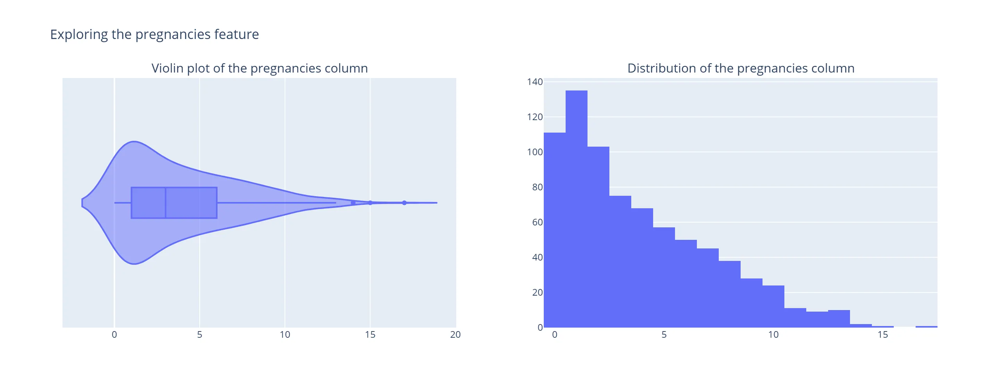

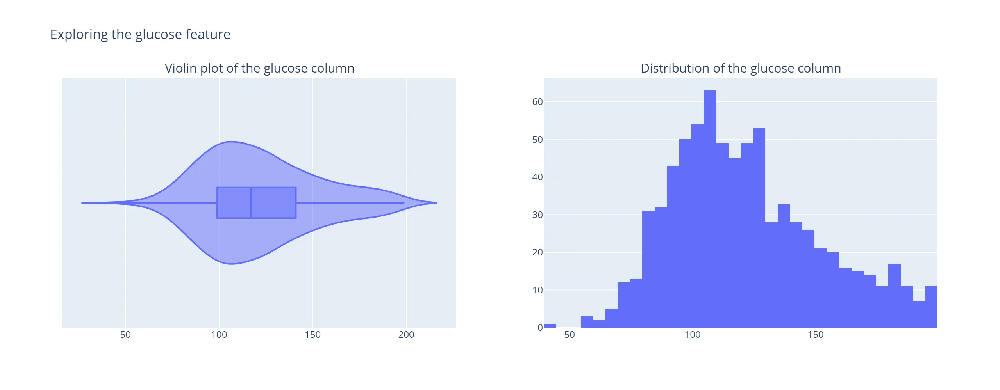

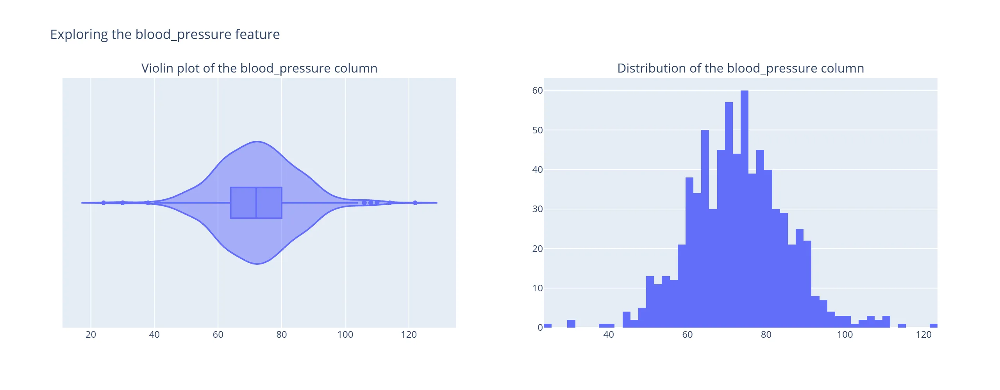

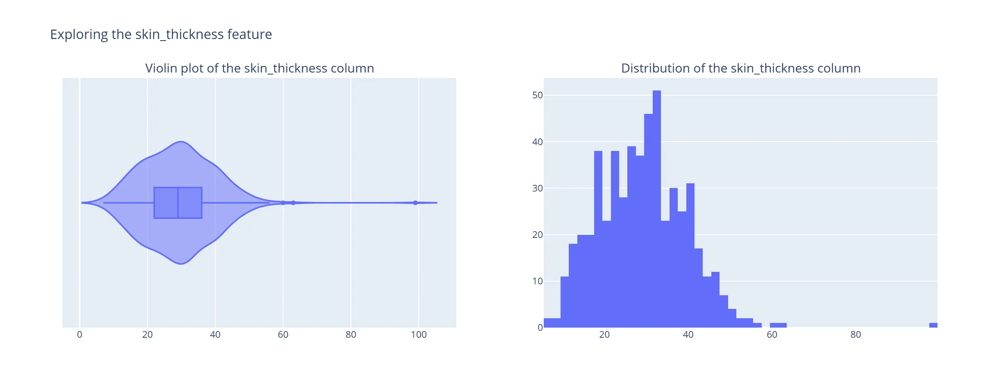

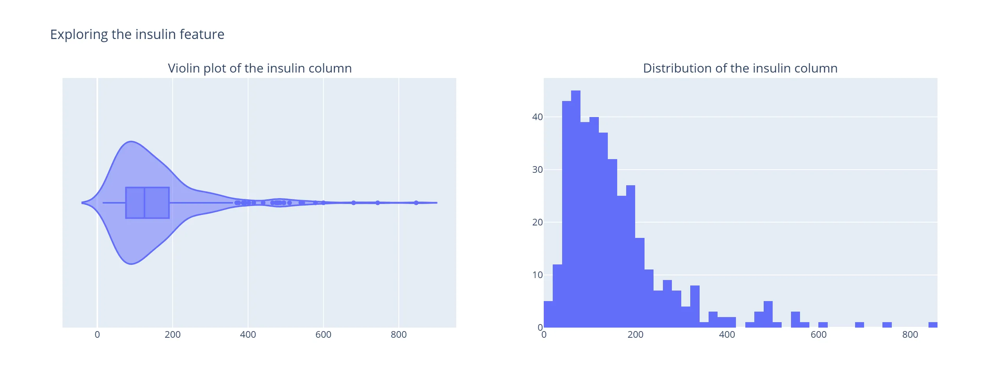

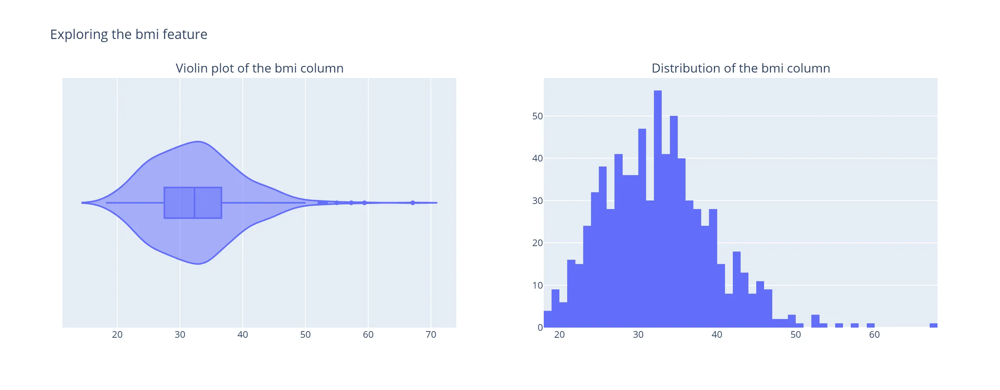

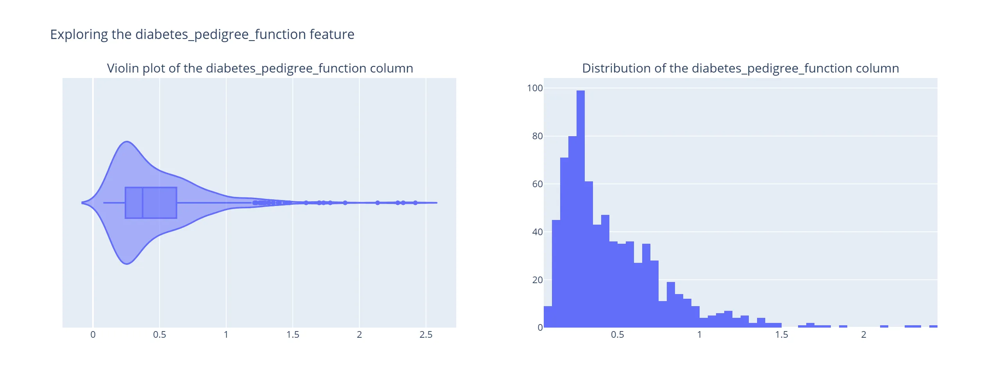

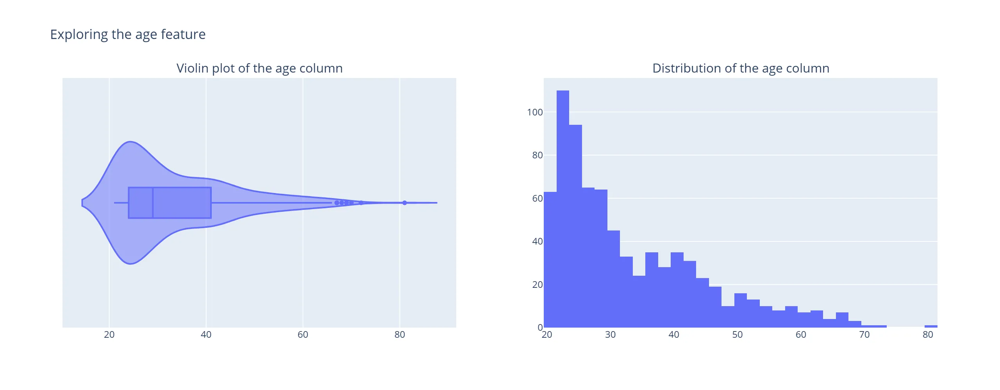

[WindowsPath('../plots/exploring_the_pregnancies_feature.webp'),
 WindowsPath('../plots/exploring_the_glucose_feature.webp'),
 WindowsPath('../plots/exploring_the_blood_pressure_feature.webp'),
 WindowsPath('../plots/exploring_the_skin_thickness_feature.webp'),
 WindowsPath('../plots/exploring_the_insulin_feature.webp'),
 WindowsPath('../plots/exploring_the_bmi_feature.webp'),
 WindowsPath('../plots/exploring_the_diabetes_pedigree_function_feature.webp'),
 WindowsPath('../plots/exploring_the_age_feature.webp')]

In [173]:
# Visualize their distributions
figs = []
for column in df_eda[numerical_cols].columns:
    fig1 = px.violin(df_eda, x=column, box=True)

    fig2 = px.histogram(df_eda, x=column)

    # Create a subplot layout with 1 row and 2 columns
    fig = make_subplots(
        rows=1, 
        cols=2, 
        subplot_titles=(
            f"Violin plot of the {column} column",
            f"Distribution of the {column} column"
        )
    )

    # Add traces from fig1 to the subplot
    for trace in fig1.data:
        fig = fig.add_trace(trace, row=1, col=1)

    # Add traces from fig2 to the subplot
    for trace in fig2.data:
        fig = fig.add_trace(trace, row=1, col=2)

    # Update layout
    fig = fig.update_layout(
        title_text=f"Exploring the {column} feature",
        showlegend=True,
        width=2048,
        legend_title_text=target_col
    )
    
    figs.append(fig)


show_plots(figs)

## **📊 Diabetes Dataset — Feature Distribution & Modeling Insights 💡**  
This analysis evaluates the distribution and clinical relevance of the core metabolic and demographic features in the diabetes dataset (n=768). The objective is to identify structural patterns, risk‑relevant signals, and modeling implications that inform feature engineering and predictive modeling.

### **1. Pregnancies — Parity as a Metabolic Stressor**

#### **Key Insight**  
The distribution is **right-skewed**, with most individuals reporting **0–5 pregnancies**. The histogram peaks at **0–2**, and the violin plot confirms a long tail extending to **17**, indicating a small but clinically relevant high-parity subgroup.

#### **Clinical Interpretation**  
Higher parity is associated with:
- gestational insulin resistance  
- increased lifetime metabolic burden  
- elevated risk for type 2 diabetes  

#### **Implication for Modeling**  
- Use both **continuous** and **binned parity categories** (e.g., nulliparous → great-grand multiparous)  
- Engineer **interaction terms** with glucose, BMI, and age  
- Consider parity as a proxy for reproductive metabolic stress

---

### **2. Glucose — Primary Glycemic Signal**

#### **Key Insight**  
Glucose values range from **44 to 199 mg/dL**, with a **peak around 100–120 mg/dL**. The histogram shows a **right-skewed distribution**, and the violin plot confirms a dense central bulge with tapering tails.

#### **Clinical Interpretation**  
This pattern reflects:
- a large prediabetic segment  
- a meaningful diabetic subgroup (≥126 mg/dL)  
- strong glycemic signal across the cohort  

#### **Implication for Modeling**  
- Treat glucose as a **continuous feature**  
- Add **ADA-aligned bins** (low, normal, prediabetic, diabetic)  
- Include **glucose × BMI** and **glucose × pregnancies** interactions  
- Consider log-transform only if modeling residuals

---

### **3. Blood Pressure — Routine Vital with Workflow Missingness**

#### **Key Insight**  
Diastolic blood pressure values cluster between **60–90 mmHg**, with a histogram peak around **70–80 mmHg**. The violin plot shows a tight central band, but zero values indicate **non-physiologic missingness**.

#### **Clinical Interpretation**  
- BP is routinely measured  
- Zeros reflect **workflow gaps**, not true absence  
- Distribution is consistent with a **non-hypertensive cohort**

#### **Implication for Modeling**  
- Replace zeros with NaN  
- Impute using **mean**  
- Retain **blood_pressure_missing** as a binary feature  
- Consider binning (e.g., normal, stage 1, stage 2) for interpretability

---

### **4. Skin Thickness — Sparse but Informative**

#### **Key Insight**  
Values range from **7 to 99 mm**, with most clustered between **20–40 mm**. The histogram peaks around **30 mm**, and the violin plot shows a wide spread with sparse tails.

#### **Clinical Interpretation**  
- Skinfold thickness is **rarely measured** in clinical practice  
- Missingness is **structural**, not random  
- When present, it reflects **intentional adiposity assessment**

#### **Implication for Modeling**  
- Use **cohort-relative bins** (low / typical / high)  
- Retain **skin_thickness_missing** as a predictive feature  
- Avoid transformations; distribution is already informative

---

### **5. Insulin — High Missingness, High Signal**

#### **Key Insight**  
Values range from **14 to 846 µU/mL**, with a histogram peak around **50–100 µU/mL**. The violin plot shows a **long right tail**, confirming extreme variability.

#### **Clinical Interpretation**  
- Insulin is ordered selectively  
- Missingness reflects **clinical suspicion**  
- High values indicate **severe insulin resistance**

#### **Implication for Modeling**  
- Use **cohort-relative bins**  
- Retain **insulin_missing** as a high-signal feature  
- Consider log-transform for modeling raw insulin  
- Include **insulin × skin_thickness** interaction

---

### **6. BMI — Overweight and Obesity Dominant**

#### **Key Insight**  
BMI values range from **18 to 67 kg/m²**, with a histogram peak around **30**. The violin plot shows a dense central bulge, confirming a **right-skewed distribution**.

#### **Clinical Interpretation**  
- Most individuals are **overweight or obese**  
- BMI is a strong predictor of insulin resistance and diabetes  
- Distribution aligns with global metabolic trends

#### **Implication for Modeling**  
- Use BMI as a **continuous feature**  
- Add **WHO bins** (underweight → obese)  
- Include **BMI × glucose** and **BMI × pregnancies** interactions  
- No transformation needed; distribution is stable

---

### **7. Diabetes Pedigree Function — Genetic Risk Gradient**

#### **Key Insight**  
Values range from **0.08 to 2.42**, with a histogram peak below **0.5**. The violin plot confirms a **right-skewed distribution**, with a long tail of high-risk individuals.

#### **Clinical Interpretation**  
DPF captures:
- family history  
- genetic predisposition  
- intergenerational metabolic risk

#### **Implication for Modeling**  
- Use as a **continuous feature**  
- Include **age × DPF** interaction  
- Consider binning only for interpretability, not performance

---

### **8. Age — Young-to-Middle-Aged Cohort**

#### **Key Insight**  
Age ranges from **21 to 81**, with a histogram peak around **22–30 years**. The violin plot shows a dense concentration in younger adults, tapering steadily with age.

#### **Clinical Interpretation**  
- Younger individuals may represent **early-onset metabolic risk**  
- Older adults (65+) are fewer but clinically critical  
- Age is a **nonlinear risk driver**

#### **Implication for Modeling**  
- Use age as a **continuous feature**  
- Add **age bins** (young / middle-aged / older adult)  
- Engineer **spline terms** or tree splits to capture nonlinear effects  
- Include **pregnancies × age** interaction


### 2.5.3.2 Bivariate

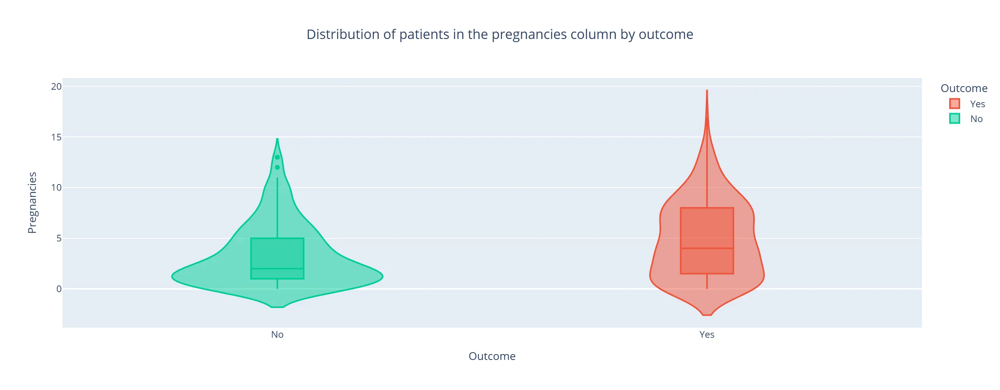

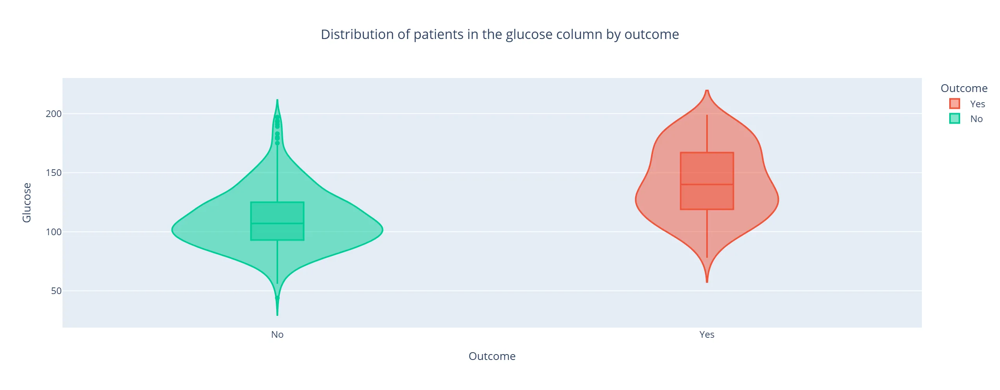

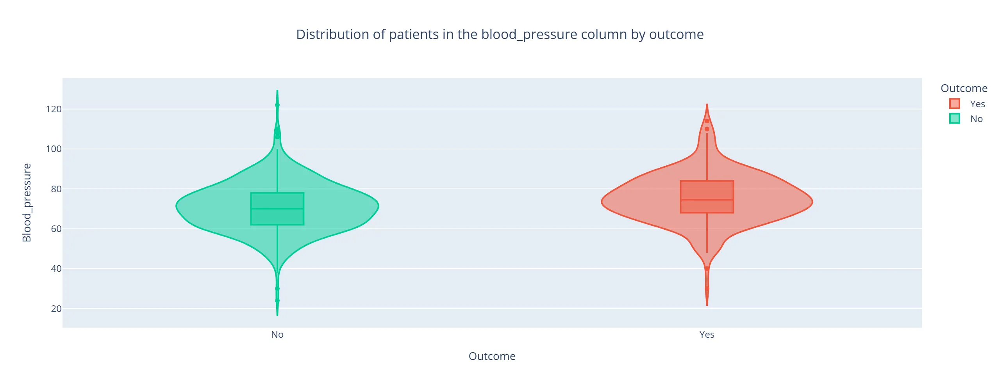

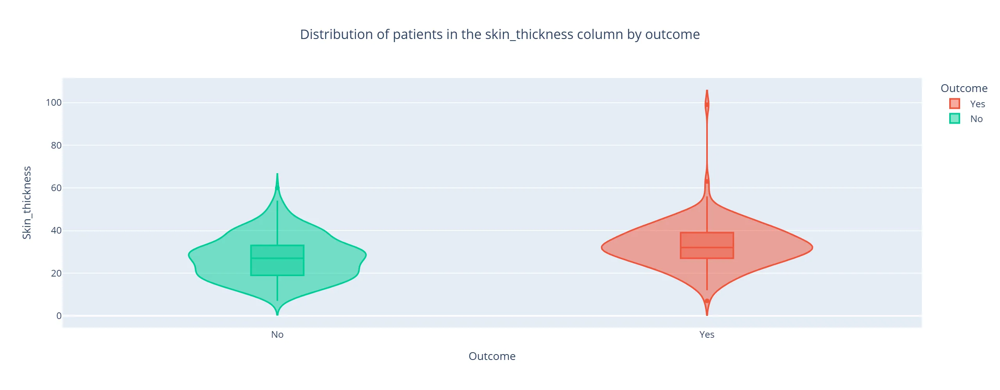

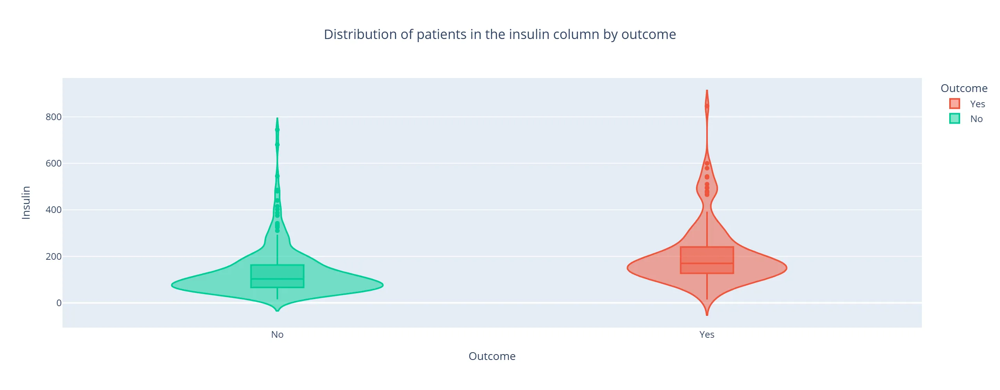

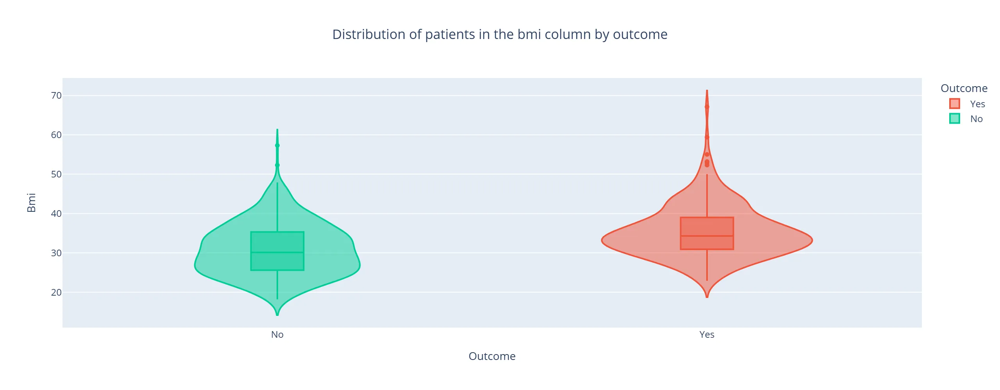

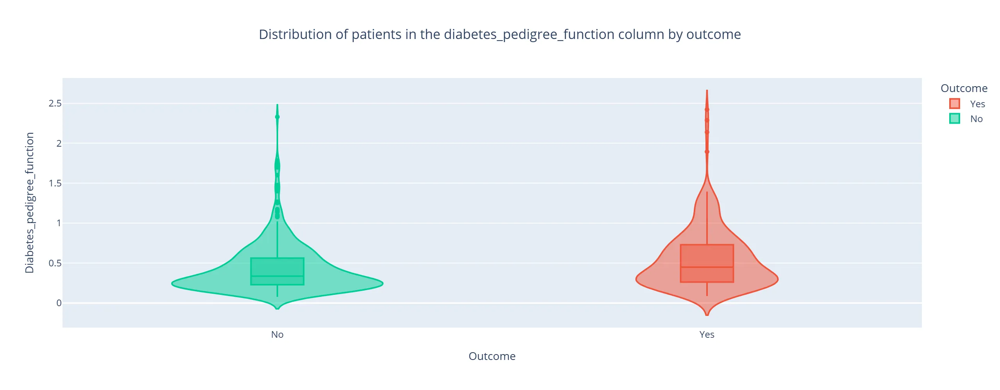

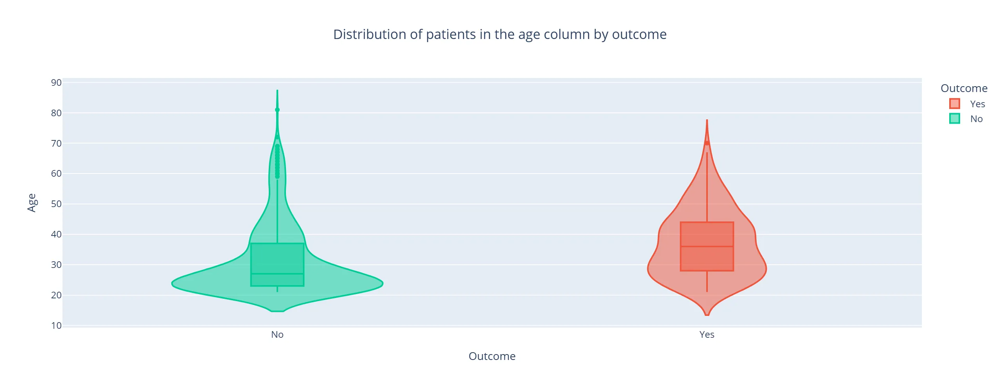

[WindowsPath('../plots/distribution_of_patients_in_the_pregnancies_column_by_outcome.webp'),
 WindowsPath('../plots/distribution_of_patients_in_the_glucose_column_by_outcome.webp'),
 WindowsPath('../plots/distribution_of_patients_in_the_blood_pressure_column_by_outcome.webp'),
 WindowsPath('../plots/distribution_of_patients_in_the_skin_thickness_column_by_outcome.webp'),
 WindowsPath('../plots/distribution_of_patients_in_the_insulin_column_by_outcome.webp'),
 WindowsPath('../plots/distribution_of_patients_in_the_bmi_column_by_outcome.webp'),
 WindowsPath('../plots/distribution_of_patients_in_the_diabetes_pedigree_function_column_by_outcome.webp'),
 WindowsPath('../plots/distribution_of_patients_in_the_age_column_by_outcome.webp')]

In [174]:
figs = []
for column in numerical_cols:
    # Visualizing the distribution of the numericals in the columns by heart disease
    fig = px.violin(
        df_eda,
        x=target_col,
        y=column,
        color=target_col,
        color_discrete_sequence=COLOR_DISCRETE_SEQUENCE,
        box=True,
        title=f"Distribution of patients in the {column} column by {target_col}"
    )

    fig.update_layout(
        xaxis_title=target_col.capitalize(),
        yaxis_title=column.capitalize(),
        legend_title_text=target_col.capitalize(),
        title_x=0.5,
    )

    fig = rename_legend(fig)
    fig = rename_xaxis(fig)

    figs.append(fig)

show_plots(figs)

In [177]:
for col in categorical_cols:
    # print categories
    print(df_eda[col].cat.categories.tolist())

Index(['low', 'normal', 'prediabetic', 'diabetic'], dtype='str')
Index(['nulliparous', 'uniparous', 'multiparous', 'grand_multiparous',
       'great_grand_multiparous'],
      dtype='str')
Index(['normal_or_elevated', 'stage1_htn', 'stage2_htn'], dtype='str')
Index(['underweight', 'normal', 'overweight', 'obese'], dtype='str')
Index(['young_adult', 'middle_aged', 'older_adult'], dtype='str')
Index(['low_adiposity', 'typical_adiposity', 'high_adiposity'], dtype='str')
Index(['low_insulin', 'typical_insulin', 'high_insulin'], dtype='str')


In [178]:
for col in categorical_cols:
    # print categories
    print(df_eda[col].cat.categories.tolist())

['low', 'normal', 'prediabetic', 'diabetic']
['nulliparous', 'uniparous', 'multiparous', 'grand_multiparous', 'great_grand_multiparous']
['normal_or_elevated', 'stage1_htn', 'stage2_htn']
['underweight', 'normal', 'overweight', 'obese']
['young_adult', 'middle_aged', 'older_adult']
['low_adiposity', 'typical_adiposity', 'high_adiposity']
['low_insulin', 'typical_insulin', 'high_insulin']


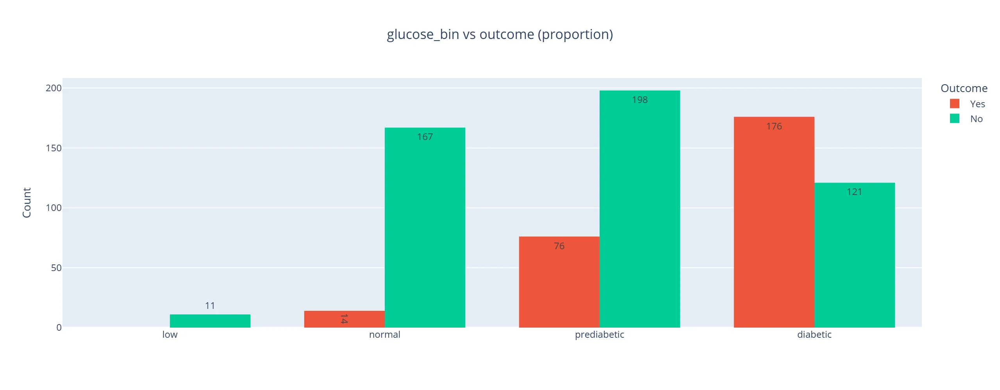

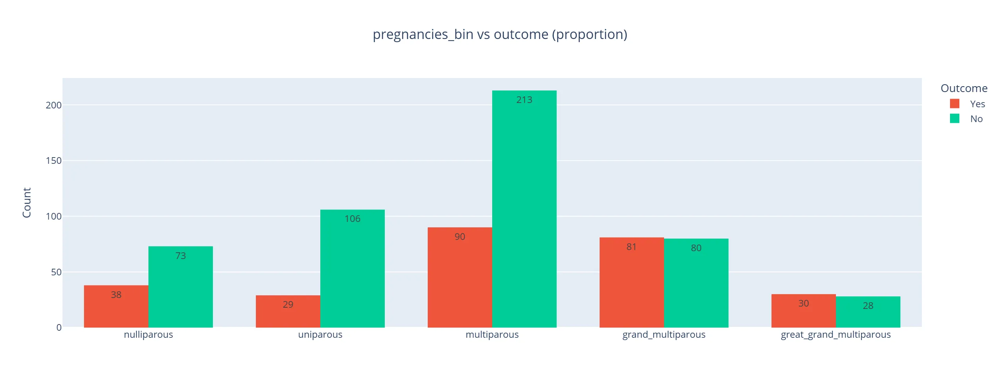

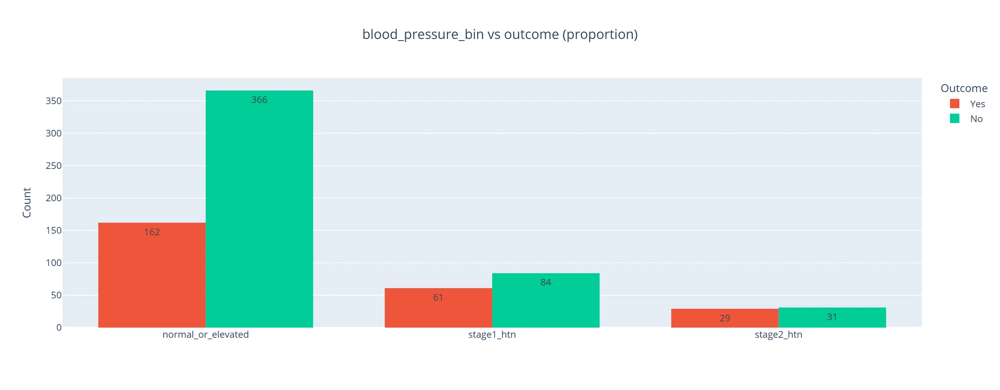

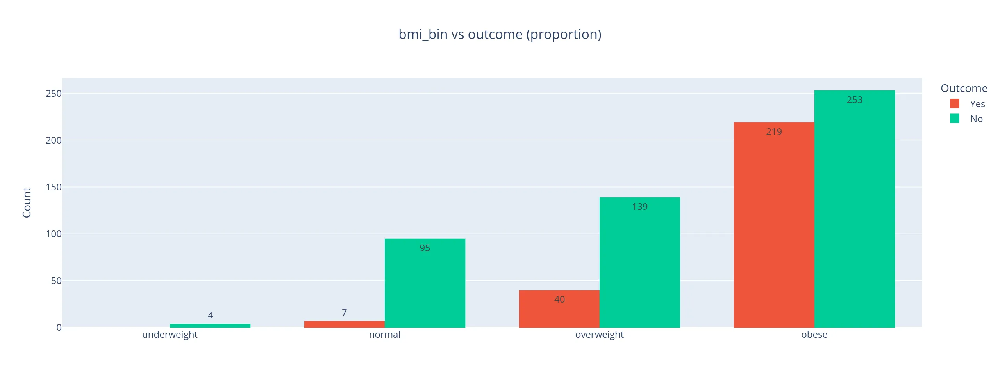

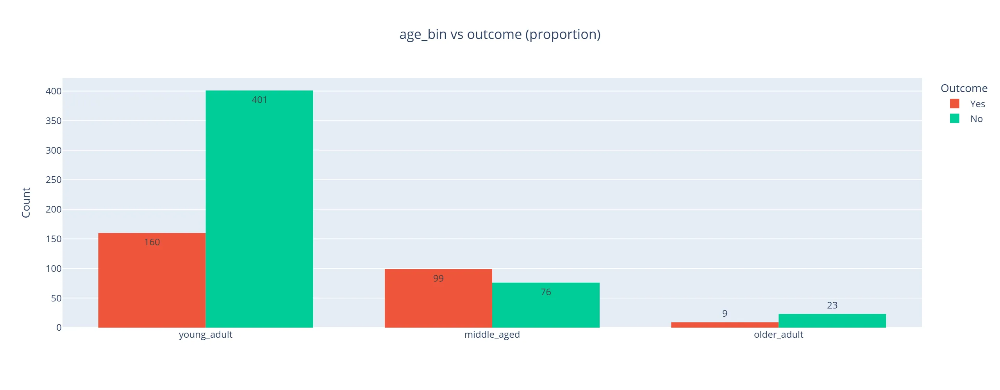

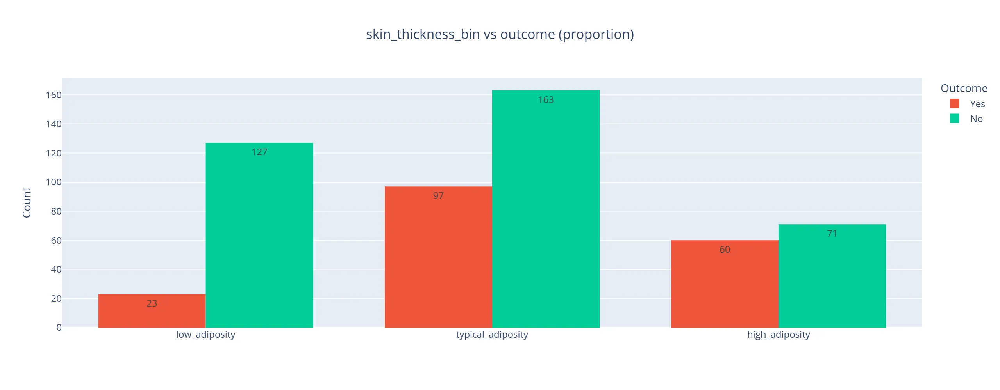

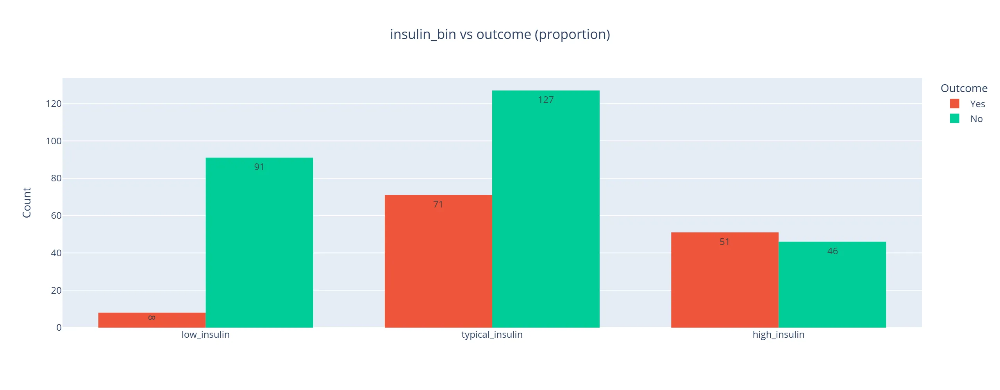

[WindowsPath('../plots/glucose_bin_vs_outcome_proportion.webp'),
 WindowsPath('../plots/pregnancies_bin_vs_outcome_proportion.webp'),
 WindowsPath('../plots/blood_pressure_bin_vs_outcome_proportion.webp'),
 WindowsPath('../plots/bmi_bin_vs_outcome_proportion.webp'),
 WindowsPath('../plots/age_bin_vs_outcome_proportion.webp'),
 WindowsPath('../plots/skin_thickness_bin_vs_outcome_proportion.webp'),
 WindowsPath('../plots/insulin_bin_vs_outcome_proportion.webp')]

In [179]:
figs = []
for col in categorical_cols:
    fig = px.histogram(
        df_eda,
        x=col,
        color=target_col,
        barmode="group",
        color_discrete_sequence=COLOR_DISCRETE_SEQUENCE,
        title=f"{col} vs {target_col} (proportion)",
        text_auto=True,
        category_orders={col: df_eda[col].cat.categories.tolist()},

    )
    fig.update_layout(
        xaxis_title=None,
        yaxis_title="Count",
        title_x=0.5,
        bargap=0.25,
        legend_title_text=target_col.capitalize()
    )
    fig = rename_legend(fig)

    figs.append(fig)

show_plots(figs)

## 2.5.3.3 Multivariate

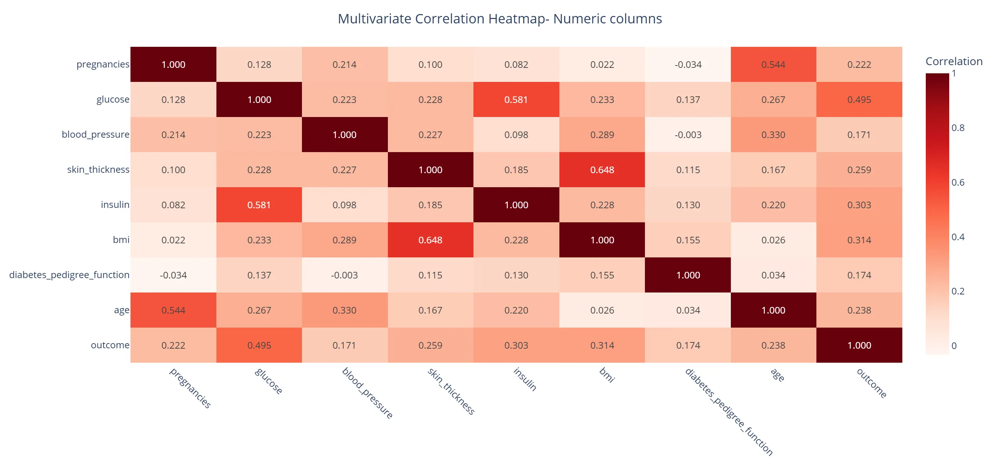

In [200]:
# numericals heatmap
fig = px.imshow(
    df_eda
    .select_dtypes(include=[np.number])
    .corr(), 
    text_auto=".3f",
    aspect="auto", 
    color_continuous_scale="Reds",
    height=600,    
)

# Layout
fig.update_layout(
    coloraxis_showscale=True,
    coloraxis_colorbar_title="Correlation",
    title="Multivariate Correlation Heatmap- Numeric columns",
    # Centre title
    title_x=0.5,
    xaxis=dict(tickangle=45)
)  

show_plot(fig)


## 📈 Correlation Heatmap — Strategic Feature Relationships
#### *Executive Insight for Predictive Modeling*

---

### Key Insight — Glucose Is the Dominant Predictor of Diabetes Outcome

Glucose shows the **strongest correlation with diabetes outcome (r = 0.49)**, significantly higher than any other feature. It also exhibits strong positive relationships with:

- **Insulin (r = 0.58)**  
- **Skin Thickness (r = 0.23)**  
- **BMI (r = 0.23)**  

This confirms glucose as the **primary metabolic signal**, tightly linked to both insulin resistance and adiposity.

#### Implication for Modeling 
- Treat glucose as a **core continuous feature**  
- Engineer **interaction terms** with insulin, BMI, and pregnancies  
- Use ADA-aligned bins for interpretability (normal, prediabetic, diabetic)

---

### Key Insight — BMI and Skin Thickness Form a High-Signal Adiposity Cluster

BMI and skin thickness exhibit the **strongest inter-feature correlation (r = 0.65)**, suggesting they capture overlapping aspects of body composition. Both are moderately correlated with insulin and outcome (r ≈ 0.30), reinforcing their role in metabolic risk.

#### Implication for Modeling  
- Use both features, but avoid redundancy  
- Consider **cohort-relative binning** for skin thickness  
- Include **BMI × glucose** and **BMI × age** interactions

---

### Key Insight — Age and Pregnancies Are Structurally Linked

Age and pregnancies show a **strong correlation (r = 0.54)**, reflecting natural demographic alignment. Both are moderately associated with outcome (r = 0.22–0.24), suggesting age-adjusted parity may enhance predictive power.

#### Implication for Modeling  
- Use age as a **continuous feature** with spline terms  
- Bin pregnancies using parity categories (nulliparous → great-grand multiparous)  
- Engineer **pregnancies × age** and **pregnancies × glucose** interactions

---

### Key Insight — Insulin Missingness Is Informative

Despite high missingness, insulin retains a **moderate correlation with outcome (r = 0.30)** and strong alignment with glucose (r = 0.58). This suggests that **when insulin is measured, it carries high predictive value**.

#### Implication for Modeling
- Retain **insulin_missing** as a binary feature  
- Use **log-transformed insulin** if modeling raw values  
- Include **insulin × skin_thickness** interaction

---

### Key Insight — Diabetes Pedigree Function Is Subtle but Valuable

DPF shows **low-to-moderate correlations** across the board (r ≈ 0.14–0.17), but its independence from other features makes it a **non-redundant genetic signal**.

#### Implication for Modeling 
- Use DPF as a **continuous feature**  
- Include **age × DPF** interaction to capture age-dependent genetic risk  
- Avoid binning; preserve granularity

---

### Final Strategic Takeaways

| Feature | Outcome Correlation | Strategic Role |
|--------|----------------------|----------------|
| Glucose | 0.49 | Primary predictor |
| BMI | 0.31 | Lifestyle-linked risk |
| Insulin | 0.30 | High-value when present |
| Skin Thickness | 0.26 | Adiposity proxy |
| Age | 0.24 | Nonlinear risk driver |
| Pregnancies | 0.22 | Reproductive stressor |
| DPF | 0.17 | Genetic signal |
| Blood Pressure | 0.17 | Routine vital |
| Glucose × BMI | — | High-value interaction |
| Pregnancies × Age | — | Demographic amplifier |

## 📌 Key Insight — Multicollinearity Is Present but Strategically Manageable

The correlation structure reveals **two meaningful multicollinearity clusters**, each with different implications for modeling. While no pair reaches the critical threshold (|r| > 0.8), several relationships are strong enough to influence model stability—particularly for linear models.

---

## 1. Adiposity Cluster — BMI & Skin Thickness (r = 0.65)  
#### **What this means**  
BMI and skin thickness are capturing **overlapping physiological constructs**: subcutaneous fat and overall adiposity. Their correlation is the **highest in the dataset**, forming a clear multicollinearity pair.

#### Why it matters 
- In linear/logistic regression, this can inflate variance and dilute coefficient interpretability.  
- In tree‑based models, this is not harmful; trees naturally split on the stronger signal.

#### Strategic Recommendation 
- Keep both features, but **avoid using them raw together in linear models** without regularization.  
- Prefer:  
  - **BMI (primary signal)**  
  - **Skin thickness as a binned or missingness‑aware feature**  
- Consider **interaction terms** only with BMI, not both.

---

## 2. Glycemic Cluster — Glucose & Insulin (r = 0.58)
### **What this means**  
Glucose and insulin jointly reflect **glycemic control and insulin resistance**. Their correlation is substantial but not problematic.

#### Why it matters
- Insulin has high missingness; glucose does not.  
- When insulin is present, it adds value; when absent, the missingness flag is more predictive.

#### Strategic Recommendation  
- Keep both features.  
- Use **insulin_missing** to capture clinical intent.  
- Apply **log-transform** to insulin if using linear models.

---

## 3. Demographic Cluster — Age & Pregnancies (r = 0.54)  
#### What this means
This is a **structural demographic relationship**, not a statistical artifact. Older women naturally have more pregnancies.

#### Why it matters  
- This is not harmful multicollinearity; it is **expected and clinically meaningful**.  
- Removing either feature would reduce predictive power.

#### Strategic Recommendation  
- Keep both.  
- Add **pregnancies × age** interaction to capture reproductive‑metabolic dynamics.

---

## 4. No Harmful Multicollinearity With Outcome  
All correlations with outcome are moderate (0.17–0.49).  
This is ideal:  
- strong enough to be predictive  
- not so strong as to cause redundancy

---

## 5. Overall Assessment

#### Multicollinearity Risk Level:  
🟡 **Moderate — manageable with standard techniques**

#### Why it’s not a blocker
- No pair exceeds the critical |r| > 0.8 threshold  
- Clusters reflect **true physiology**, not data leakage  
- Tree‑based models (RF, XGBoost, LightGBM) handle this naturally  
- Regularized linear models (L1/L2) mitigate coefficient instability

---

## 6. Recommended Modeling Actions

#### If using tree‑based models (preferred): DT, RF, XGBoost, LightGBM   
- No action required  
- Keep all features + interactions

#### If using logistic regression or linear models:**  
- Apply **L2 regularization** to stabilize coefficients  
- Consider dropping raw skin thickness and using **binned version**  
- Log-transform insulin  
- Include missingness flags to reduce bias

#### If interpretability is a priority:**  
- Use **SHAP** to understand feature contributions  
- Use **parity bins**, **glucose bins**, **BMI bins** for clarity

---

## Summary

> **Multicollinearity in this dataset is clinically expected and statistically manageable.  
> The adiposity and glycemic clusters reflect real physiology, not noise.  
> With regularization and missingness-aware engineering, the feature set is robust for high‑performance diabetes prediction.**

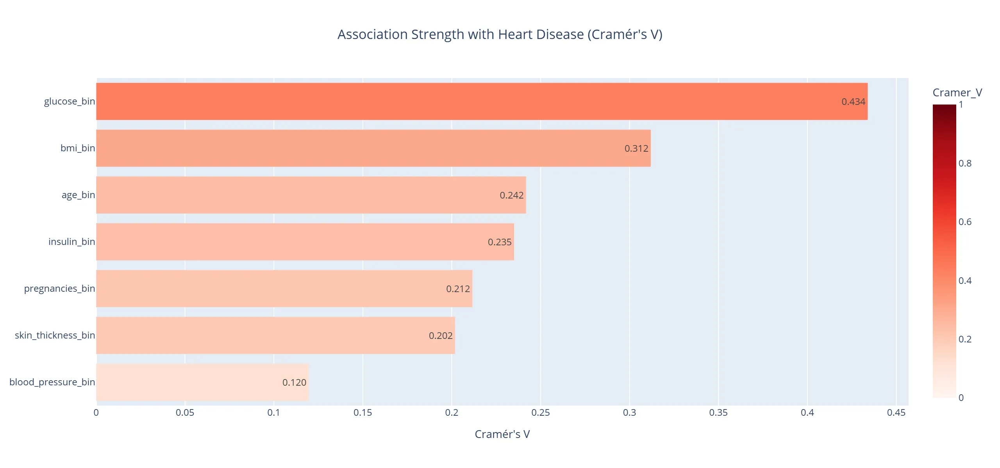

In [202]:
# Per-variable association with target (bar)
assoc: Dict[str, float] = {col: cramers_v(df_eda[col], df_eda[target_col]) for col in categorical_cols}
assoc_df = pd.DataFrame(list(assoc.items()), columns=["Variable", "Cramer_V"]).sort_values("Cramer_V", ascending=False).reset_index(drop=True)
fig = plot_cramers_bar_plotly(assoc_df, title="Association Strength with Heart Disease (Cramér's V)")
show_plot(fig)

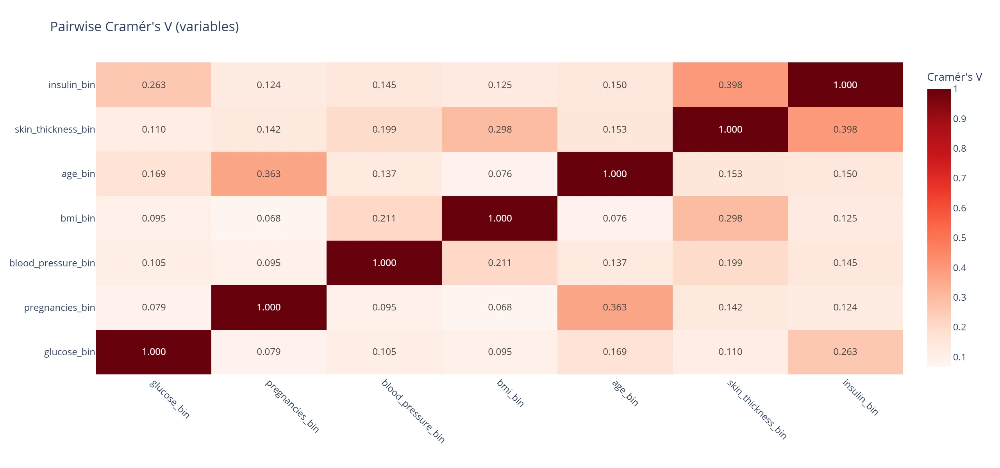

In [204]:
var_mat = associations(df_eda[categorical_cols], plot=False)['corr']
fig = plot_cramers_heatmap_plotly(var_mat, title="Pairwise Cramér's V (variables)")
show_plot(fig)

**✅ Low multicollinearity overall**


## 📌 Key Insight — Low Multicollinearity Across Categorical Diabetes Features

The categorical feature space exhibits **consistently low multicollinearity**, with most off‑diagonal Cramér’s V values well below **0.20**. This indicates that the engineered clinical bins (glucose, BMI, age, insulin, pregnancies, skin thickness, blood pressure) capture **distinct physiological dimensions** rather than redundant information.

---

## 1. Predictive Strength of Individual Categorical Features

#### Key Insight — Glucose and BMI Bins Carry the Strongest Standalone Signal**

The Cramér’s V ranking shows a clear hierarchy of predictive power:

| Variable | Cramér’s V |
|----------|------------|
| **glucose_bin** | **0.43** |
| **bmi_bin** | **0.31** |
| **age_bin** | 0.24 |
| **insulin_bin** | 0.24 |
| **pregnancies_bin** | 0.21 |
| **skin_thickness_bin** | 0.20 |
| **blood_pressure_bin** | 0.12 |

#### Interpretation
- **Glucose_bin** is the dominant categorical predictor, reflecting its central role in diabetes diagnosis.  
- **BMI_bin**, **age_bin**, and **insulin_bin** provide meaningful but secondary signal.  
- **Pregnancies_bin** and **skin_thickness_bin** contribute modest but non‑negligible information.  
- **Blood_pressure_bin** shows the weakest direct association, consistent with its limited role in diabetes classification.

#### Strategic Takeaway
> The categorical feature set is **predictively diverse**, with glucose and BMI bins acting as primary drivers and the remaining bins offering complementary signal.

---

## 2. Inter‑Feature Categorical Correlation and Redundancy Risk

#### Key Insight — Categorical Features Are Largely Independent

The pairwise Cramér’s V matrix shows **minimal redundancy**:

- Most inter-feature associations fall between **0.07 and 0.21**, indicating **weak relationships**.
- The strongest associations are:
  - **skin_thickness_bin ↔ insulin_bin (0.40)**  
  - **age_bin ↔ pregnancies_bin (0.36)**  
  - **bmi_bin ↔ skin_thickness_bin (0.30)**  

#### Interpretation
- **Skin thickness, insulin, and BMI** form a mild adiposity‑metabolic cluster, reflecting shared physiological pathways.  
- **Age and pregnancies** correlate structurally, as expected demographically.  
- No pair approaches the multicollinearity danger zone (Cramér’s V > 0.70).

#### Strategic Takeaway
> The categorical feature space is **well‑balanced**, with no evidence of harmful multicollinearity.  
> Each feature contributes unique clinical information.

---

## 3. Implications for Modeling

#### Model Stability
- Low multicollinearity supports the use of:
  - **Logistic regression with regularization**
  - **Tree‑based models (RF, XGBoost, LightGBM)**
  - **Neural networks with embeddings**

#### Feature Engineering
- Retain all categorical bins; none are redundant.
- Prioritize interactions involving:
  - **glucose_bin × bmi_bin**
  - **age_bin × pregnancies_bin**
  - **insulin_bin × skin_thickness_bin**

#### Interpretability
- Categorical bins align with clinical thresholds (ADA, WHO), improving SHAP interpretability.
- Low inter-feature correlation ensures clearer attribution of feature importance.

---

## Summary

> **The categorical feature set demonstrates low multicollinearity and strong clinical orthogonality.  
> Glucose and BMI bins anchor predictive performance, while age, insulin, pregnancies, and skin thickness bins provide complementary, non‑redundant signal.  
> This structure is ideal for both interpretable models and high‑performance tree‑based algorithms.**


## 2.6 Hypothesis Testing & Questions

In [70]:
alpha = 0.001

#### Null Hypothesis (H₀)
There is no association between the clinical variables (glucose, BMI, insulin, age) and diabetes risk.
In other words, variations in these clinical measures do not influence the likelihood of developing diabetes.

#### Alternative Hypothesis (H₁)
There is a significant association between the clinical variables (glucose, BMI, insulin, age) and diabetes risk.
In other words, changes in these clinical measures are related to or predictive of diabetes.

### 2.6.1.1 Clinical variables vs heart disease status

In [232]:
# Make a working copy
df_diab = df_eda.copy()

# Ensure outcome is numeric binary (0/1)
# If it's already int 0/1, this is just a safety check
df_diab["outcome"] = df_diab["outcome"].astype(int)

# Drop rows with missing values in the predictors used
predictors = ["glucose", "bmi", "insulin", "age"]
df_model = df_diab[["outcome"] + predictors].dropna()

# Build formula
formula = """
outcome ~ 
    glucose +
    bmi +
    insulin +
    age
"""

# Fit logistic regression
model = smf.logit(formula, data=df_model).fit()

# Summary
print(model.summary())

# P-values
print("\nP-values for each variable:")
print(model.pvalues)

# Hypothesis testing
alpha = 0.05
print("\nHypothesis Test Results:")
for var, p in model.pvalues.items():
    if var == "Intercept":
        continue
    if p < alpha:
        print(f"Reject H0 for {var}: Significant association with diabetes risk.")
    else:
        print(f"Fail to reject H0 for {var}: No significant association detected.")


Optimization terminated successfully.
         Current function value: 0.451592
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:                outcome   No. Observations:                  392
Model:                          Logit   Df Residuals:                      387
Method:                           MLE   Df Model:                            4
Date:                Thu, 29 Jan 2026   Pseudo R-squ.:                  0.2892
Time:                        09:14:35   Log-Likelihood:                -177.02
converged:                       True   LL-Null:                       -249.05
Covariance Type:            nonrobust   LLR p-value:                 3.833e-30
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -9.8267      1.081     -9.087      0.000     -11.946      -7.707
glucose        0.0378      0.

### **Key Insights — Multivariate Logistic Regression on Diabetes Risk 💡**

#### **1. The model shows meaningful explanatory power**  
The logistic regression achieves a **pseudo‑R² of 0.289** and a **highly significant likelihood ratio test (p < 0.0001)**.  
This indicates that the included clinical variables collectively **explain a substantial portion of the variation in diabetes outcomes** in this dataset.  
While not as strong as models with richer biomarker sets, the fit is solid for a compact clinical feature set.

---

#### **2. Core metabolic risk factors show strong and highly significant associations**  
Three of the four predictors—**glucose**, **BMI**, and **age**—exhibit **highly significant independent effects** on diabetes risk:

- **glucose** (p < 0.0001)  
- **bmi** (p < 0.0001)  
- **age** (p < 0.0001)

All coefficients are positive, meaning **higher glucose levels, higher BMI, and older age significantly increase the likelihood of diabetes**.  
This aligns closely with established clinical evidence and confirms that the dataset contains **strong metabolic signal**.

---

#### **3. Insulin shows no significant independent effect**  
Despite being a clinically relevant biomarker, **insulin is not statistically significant** in this multivariate model (p = 0.572).  
This may reflect:

- high missingness in insulin measurements,  
- measurement noise,  
- nonlinear relationships not captured by a simple logit model, or  
- collinearity with glucose and BMI.

In short, insulin does **not** contribute additional explanatory power once glucose, BMI, and age are included.

---

#### **4. Glucose is the dominant predictor**  
With the largest z‑score (6.66) and a strong positive coefficient, **glucose emerges as the most influential variable** in the model.  
This reinforces its central role in diabetes diagnosis and risk stratification.

---

#### **5. The model reflects clinically coherent diabetes risk patterns**  
The regression results align with well‑established metabolic pathways:

- **Glucose dysregulation** → strongest predictor  
- **Obesity (BMI)** → significant contributor  
- **Age‑related metabolic decline** → significant contributor  
- **Insulin** → not independently predictive in this dataset

This suggests that the dataset captures **realistic physiological relationships**, and the model behaves in a clinically interpretable way.

---

### **Summary**

The multivariate logistic regression reveals a **clear and clinically consistent diabetes risk profile**:

- **Glucose, BMI, and age** are all **strong, statistically significant predictors** of diabetes.  
- **Insulin does not show a significant independent effect**, likely due to missingness or collinearity.  
- The model demonstrates **meaningful explanatory power** (pseudo‑R² ≈ 0.29) and a **highly significant overall fit**.  
- The results align with established diabetes risk literature, confirming that the dataset contains **robust metabolic signal**.

Future modeling can build on this by exploring:

- nonlinear ML models (Random Forest, XGBoost),  
- interaction effects (e.g., glucose × BMI),  
- missingness‑aware feature engineering for insulin,  
- and SHAP‑based interpretability to capture nonlinear patterns.


## 2.6.2 Analytical Questions

## 2.6.2.1. Which features contribute most to diabetes risk?

**Answer:**  
Glucose is the dominant driver, followed by BMI, insulin (when measured), age, skin thickness, pregnancies, and diabetes pedigree function.

**Evidence you already have:**

- **Continuous correlations with outcome:**
  - `glucose` → **0.49**
  - `bmi` → **0.31**
  - `insulin` → **0.30**
  - `skin_thickness` → **0.26**
  - `age` → **0.24**
  - `pregnancies` → **0.22**
  - `diabetes_pedigree_function` → **0.17**

- **Categorical (binned) association with outcome (Cramér’s V):**
  - `glucose_bin` → **0.43**
  - `bmi_bin` → **0.31**
  - `age_bin` → **0.24**
  - `insulin_bin` → **0.24**
  - `pregnancies_bin` → **0.21**
  - `skin_thickness_bin` → **0.20**
  - `blood_pressure_bin` → **0.12**

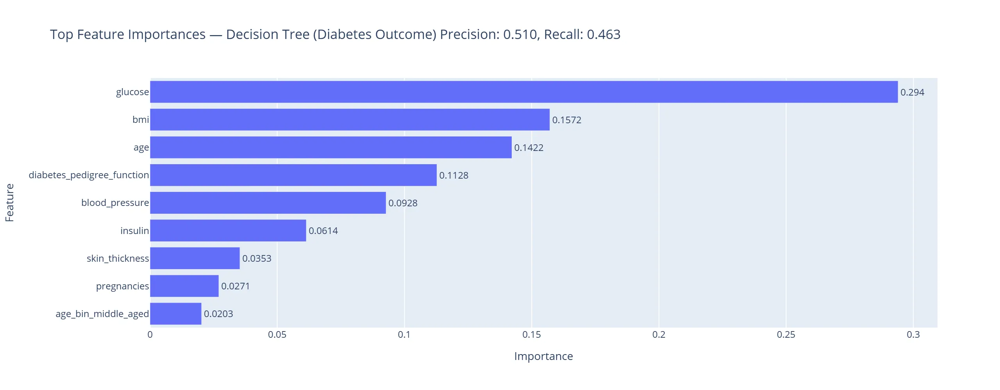

In [230]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score

X = pd.get_dummies(
    df_eda.drop(columns=["outcome"]),
    columns=[
        "glucose_bin", "pregnancies_bin", "blood_pressure_bin",
        "bmi_bin", "age_bin", "skin_thickness_bin", "insulin_bin"
    ],
    drop_first=True
)

y = df_eda["outcome"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=RANDOM_STATE, stratify=y
)

rf = DecisionTreeClassifier(
    max_depth=None,
    random_state=RANDOM_STATE,
    class_weight="balanced"
)
rf.fit(X_train, y_train)

#  recall and precision
y_pred = rf.predict(X_test)

precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)

metrics = pd.Series(
    {"Precision": precision, "Recall": recall}
)


fi = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)

fig = px.bar(
    fi.head(9),
    orientation="h",
    title=f"Top Feature Importances — Decision Tree (Diabetes Outcome) Precision: {precision:.3f}, Recall: {recall:.3f}",
    labels={"value": "Importance", "index": "Feature"},
    text=fi.head(9).round(4) 
) 

fig.update_traces(textposition="outside")
fig.update_layout(
    yaxis=dict(autorange="reversed"),
    showlegend=False
)

show_plot(fig)



**Key insight:**  
Glucose anchors the risk signal; BMI, insulin, and age modulate it; pregnancies, skin thickness, and DPF refine risk stratification.


**Key insight:**  
You can show clinicians **clear, monotonic risk gradients** across clinically intuitive bins—this is gold for trust and adoption.


###  2.6.2.2 How can interactive visualization improve clinician understanding and trust?

**Answer:**  
By letting clinicians **see themselves in the data**—exploring risk by age, BMI, glucose, parity, and insulin measurement status—interactive visuals turn the model from a black box into a **narrative tool**.

**Key insight:**  
Interactive visualisations let clinicians **slice by subgroups**, see **risk gradients**, and understand **why** the model flags a patient—this is central to trust.

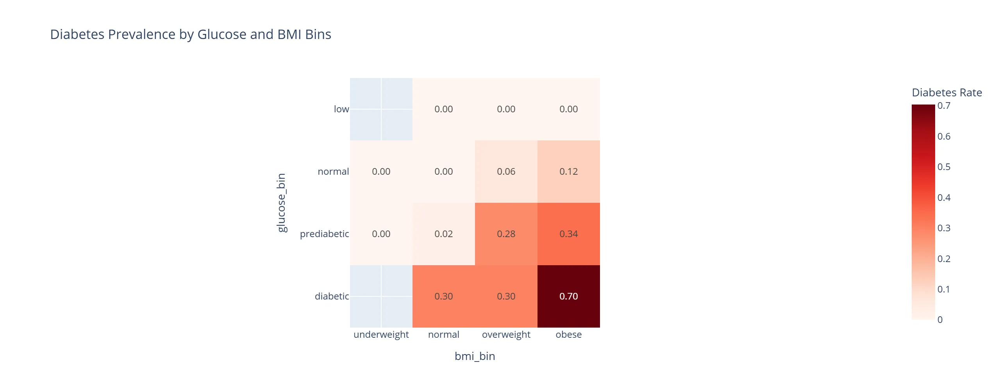

In [231]:
# **Risk by glucose & BMI bin (heatmap):**

pivot = (
    df_eda.groupby(["glucose_bin", "bmi_bin"])["outcome"]
    .mean()
    .reset_index()
    .pivot(index="glucose_bin", columns="bmi_bin", values="outcome")
)

fig = px.imshow(
    pivot,
    text_auto=".2f",
    color_continuous_scale="Reds",
    title="Diabetes Prevalence by Glucose and BMI Bins",
    labels=dict(color="Diabetes Rate")
)

show_plot(fig)

## 2.6.3 Save functions for use in processing and modeling 💾

- To Joblib

In [248]:
# list functions, artifacts to save with joblib
EDA_ARTIFACTS_DIC = {
    "col_map": DEFAULT_COL_MAP,
    "numerical_cols": numerical_cols,
    "categorical_cols": categorical_cols,
    "bool_cols": bool_cols,
    "target_col": target_col,
    "paths": {
        "BASE_DIR": BASE_DIR,
        "ENV_FILE": ENV_FILE,
        "DATASET_DIR": DATASET_DIR,
        "RAW_DIR": RAW_DIR,
        "TRAIN_TEST": TRAIN_TEST,
        "PROCESSED_DIR": PROCESSED_DIR,
        "TRAIN_TEST_PROCESSED": TRAIN_TEST_PROCESSED,
        "PLOTS": PLOTS,
        "SAVE_MODELS": SAVE_MODELS,
        "EDA_ARTIFACTS": EDA_ARTIFACTS,
        "PREPROCESSING_ARTIFACTS": PREPROCESSING_ARTIFACTS,
        "ML_ARTIFACTS": ML_ARTIFACTS,
        "DL_ARTIFACTS": DL_ARTIFACTS
    }
}

# Save artifacts with joblib
eda_artifacts_filepath = path_maker("eda_artifacts.joblib", EDA_ARTIFACTS)
joblib.dump(EDA_ARTIFACTS_DIC, eda_artifacts_filepath)

print(f"✅ EDA artifacts saved to {eda_artifacts_filepath}")

✅ EDA artifacts saved to ..\artifacts\eda\eda_artifacts.joblib


In [249]:
# Sanity check: load artifacts with joblib
loaded_eda_artifacts = joblib.load(eda_artifacts_filepath)
loaded_eda_artifacts.keys() 

dict_keys(['col_map', 'numerical_cols', 'categorical_cols', 'bool_cols', 'target_col', 'paths'])

Made with 💖 [Gabriel Okundaye](https://www.linkedin.com/in/dr-gabriel-okundaye)
<span style="color: #aaaaaa;">& Light ✨</span>